# Contents
* [Introduction](#Introduction)
* [Imports and configuration](#Imports-and-configuration)
* [Feature extraction](#Feature-extraction)
  * [LOF of LDA components](#LOF-of-LDA-components)
  * [RBF kernel](#RBF-kernel)
  * [Sigmoid kernel](#Sigmoid-kernel)
  * [Polynomial kernel](#Polynomial-kernel)

# Introduction

To speed development, 5-fold train-test splits were preprocessed and prepared as separate .feather files. This notebook extracts several new features. The resultant scores may be considered newly extracted features or perhaps may be sufficient without the FRILL embeddings.

In [1]:
from time import time

notebook_begin_time = time()

# set random seeds

from os import environ
from random import seed as random_seed
from numpy.random import seed as np_seed
from tensorflow.random import set_seed


def reset_seeds(seed: int) -> None:
    """Utility function for resetting random seeds"""
    environ["PYTHONHASHSEED"] = str(seed)
    random_seed(seed)
    np_seed(seed)
    set_seed(seed)


reset_seeds(SEED := 2021)
del environ
del random_seed
del np_seed
del set_seed
del reset_seeds

In [2]:
# extensions
%load_ext autotime
%load_ext lab_black
%load_ext nb_black

In [3]:
# core
import numpy as np
import pandas as pd

# utility
from gc import collect as gc_collect

# faster sklearn
from sklearnex import patch_sklearn

patch_sklearn()
del patch_sklearn

# typing
from sklearn.base import BaseEstimator
from typing import Callable, List

# feature engineering
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import SGDOneClassSVM
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM

# visualization
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_context("notebook")
%matplotlib inline

# display outputs w/o print calls
from IPython.core.interactiveshell import InteractiveShell

InteractiveShell.ast_node_interactivity = "all"
del InteractiveShell

# hide warnings
import warnings

# warnings.filterwarnings("ignore")
del warnings

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


time: 2.99 s


In [4]:
# Location of CV .feather files
CV_FEATHERS_FOLDER = "."

# Location where this notebook will output
DATA_OUT_FOLDER = "."

_ = gc_collect()

time: 101 ms


# Setup

In [5]:
VALENCE = {"neg": 0, "neu": 1, "pos": 2}


def extract_ocsvm_features(
    model_base: Callable, descriptor: str, folds_completed: List[int] = []
) -> None:

    for fold_num in (0, 1, 2, 3, 4):
        if fold_num in folds_completed:
            continue
        fold_begin = time()
        read_feather = lambda filename: pd.read_feather(
            f"{CV_FEATHERS_FOLDER}/cv_{fold_num}/{filename}.feather"
        )

        print("reading data...")
        X_train = read_feather("X_train_untransformed")
        frill_columns = X_train.columns
        y_train = read_feather("y_train_untransformed").iloc[:, 0]

        # one-class scores of FRILL embeddings
        print("extracting one-class scores of FRILL embeddings...")
        neg_classifier = model_base().fit(X_train.loc[y_train == 0, :])
        neu_classifier = model_base().fit(X_train.loc[y_train == 1, :])
        pos_classifier = model_base().fit(X_train.loc[y_train == 2, :])
        X_train[f"ocsvm_{descriptor}_neg"] = neg_classifier.score_samples(
            X_train.loc[:, frill_columns]
        )
        X_train[f"ocsvm_{descriptor}_neu"] = neu_classifier.score_samples(
            X_train.loc[:, frill_columns]
        )
        X_train[f"ocsvm_{descriptor}_pos"] = pos_classifier.score_samples(
            X_train.loc[:, frill_columns]
        )
        X_test = read_feather("X_test_untransformed")  # load x_test jit
        X_test[f"ocsvm_{descriptor}_neg"] = neg_classifier.score_samples(
            X_test.loc[:, frill_columns]
        )
        X_test[f"ocsvm_{descriptor}_neu"] = neu_classifier.score_samples(
            X_test.loc[:, frill_columns]
        )
        X_test[f"ocsvm_{descriptor}_pos"] = pos_classifier.score_samples(
            X_test.loc[:, frill_columns]
        )

        # LDA components of one-class scores of FRILL embeddings
        print("extracting LDA components of one-class scores of FRILL embeddings...")
        lda = LinearDiscriminantAnalysis().fit(
            X_train.loc[
                :,
                [
                    f"ocsvm_{descriptor}_neg",
                    f"ocsvm_{descriptor}_neu",
                    f"ocsvm_{descriptor}_pos",
                ],
            ].values,
            y_train.values,
        )
        components = (
            lda.transform(
                X_train.loc[
                    :,
                    [
                        f"ocsvm_{descriptor}_neg",
                        f"ocsvm_{descriptor}_neu",
                        f"ocsvm_{descriptor}_pos",
                    ],
                ].values,
            ),
        )
        X_train[f"{descriptor}_LDA1"] = components[0][:, 0]
        X_train[f"{descriptor}_LDA2"] = components[0][:, 1]
        components = lda.transform(
            X_test.loc[
                :,
                [
                    f"ocsvm_{descriptor}_neg",
                    f"ocsvm_{descriptor}_neu",
                    f"ocsvm_{descriptor}_pos",
                ],
            ].values
        )
        X_test[f"{descriptor}_LDA1"] = components[:, 0]
        X_test[f"{descriptor}_LDA2"] = components[:, 1]
        del lda
        _ = gc_collect()

        # one-class scores of LDA components of FRILL embeddings
        print("extracting one-class scores of LDA components of FRILL embeddings...")
        components = read_feather("X_train_LDA")
        neg_classifier = model_base().fit(components.loc[y_train == 0, :])
        neu_classifier = model_base().fit(components.loc[y_train == 1, :])
        pos_classifier = model_base().fit(components.loc[y_train == 2, :])
        X_train[f"LDA_{descriptor}_neg"] = neg_classifier.score_samples(components)
        X_train[f"LDA_{descriptor}_neu"] = neu_classifier.score_samples(components)
        X_train[f"LDA_{descriptor}_pos"] = pos_classifier.score_samples(components)
        components = read_feather("X_test_LDA")
        X_test[f"LDA_{descriptor}_neg"] = neg_classifier.score_samples(components)
        X_test[f"LDA_{descriptor}_neu"] = neu_classifier.score_samples(components)
        X_test[f"LDA_{descriptor}_pos"] = pos_classifier.score_samples(components)
        del components
        _ = gc_collect()

        # save data
        print("saving...")
        X_train.drop(columns=frill_columns).to_feather(
            f"{DATA_OUT_FOLDER}/cv_{fold_num}/X_train_OC_{descriptor}.feather"
        )
        X_test.drop(columns=frill_columns).to_feather(
            f"{DATA_OUT_FOLDER}/cv_{fold_num}/X_test_OC_{descriptor}.feather"
        )
        del X_train
        del X_test
        _ = gc_collect()

        # plot
        df = pd.read_feather(
            f"{DATA_OUT_FOLDER}/cv_{fold_num}/X_train_OC_{descriptor}.feather"
        )
        df_test = pd.read_feather(
            f"{DATA_OUT_FOLDER}/cv_{fold_num}/X_test_OC_{descriptor}.feather"
        )
        y_test = pd.read_feather(
            f"{DATA_OUT_FOLDER}/cv_{fold_num}/y_test_untransformed.feather"
        ).iloc[:, 0]

        fig = plt.figure(figsize=(10, 5))
        ax = fig.add_subplot(121, projection="3d")
        ax.scatter(
            df[f"ocsvm_{descriptor}_neg"],
            df[f"ocsvm_{descriptor}_neu"],
            df[f"ocsvm_{descriptor}_pos"],
            alpha=0.25,
            linewidth=0,
            cmap="viridis",
            c=y_train,
        )
        ax = fig.add_subplot(122, projection="3d")
        ax.scatter(
            df_test[f"ocsvm_{descriptor}_neg"],
            df_test[f"ocsvm_{descriptor}_neu"],
            df_test[f"ocsvm_{descriptor}_pos"],
            alpha=0.25,
            linewidth=0,
            cmap="viridis",
            c=y_test,
        )
        plt.suptitle(f"one-class {descriptor} scores of FRILL embeddings")
        plt.show()

        fig, ax = plt.subplots(1, 2)
        sns.scatterplot(
            x=f"{descriptor}_LDA1",
            y=f"{descriptor}_LDA2",
            hue=y_train,
            data=df,
            palette="viridis",
            hue_order=[0, 1, 2],
            alpha=0.25,
            legend=False,
            linewidth=0,
            marker=".",
            s=50,
            ax=ax[0],
        )
        ax[0].set_xlabel("")
        ax[0].set_ylabel("")
        sns.scatterplot(
            x=f"{descriptor}_LDA1",
            y=f"{descriptor}_LDA2",
            hue=y_test,
            data=df_test,
            palette="viridis",
            hue_order=[0, 1, 2],
            alpha=0.25,
            legend=False,
            linewidth=0,
            marker=".",
            s=50,
            ax=ax[1],
        )
        sns.despine(**dict.fromkeys(("top", "right"), True))
        ax[1].set_xlabel("")
        ax[1].set_ylabel("")
        plt.suptitle(
            f"LDA components of one-class {descriptor} scores of FRILL embeddings"
        )
        plt.show()

        fig = plt.figure(figsize=(10, 5))
        ax = fig.add_subplot(121, projection="3d")
        ax.scatter(
            df[f"LDA_{descriptor}_neg"],
            df[f"LDA_{descriptor}_neu"],
            df[f"LDA_{descriptor}_pos"],
            alpha=0.25,
            linewidth=0,
            cmap="viridis",
            c=y_train,
        )
        ax = fig.add_subplot(122, projection="3d")
        ax.scatter(
            df_test[f"LDA_{descriptor}_neg"],
            df_test[f"LDA_{descriptor}_neu"],
            df_test[f"LDA_{descriptor}_pos"],
            alpha=0.25,
            linewidth=0,
            cmap="viridis",
            c=y_test,
        )
        _ = gc_collect()
        plt.suptitle(
            f"one-class {descriptor} scores of LDA components of FRILL embeddings"
        )
        plt.show()

        print(f"fold {fold_num + 1} completed in {time() - fold_begin:.2f} s")

        del df
        del df_test
        del y_train
        del y_test
        del fig
        del ax
        del fold_begin
        _ = gc_collect()

time: 9.97 ms


# Feature extraction

## LOF of LDA components

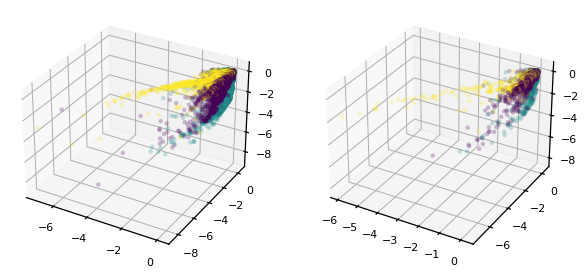

fold 1 completed in 6.24 s


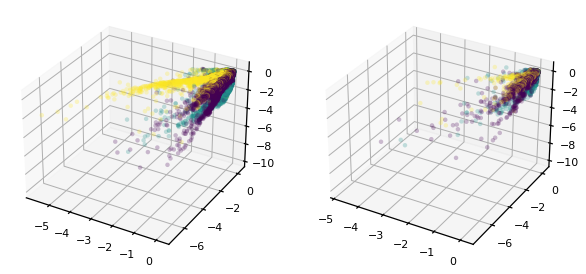

fold 2 completed in 5.90 s


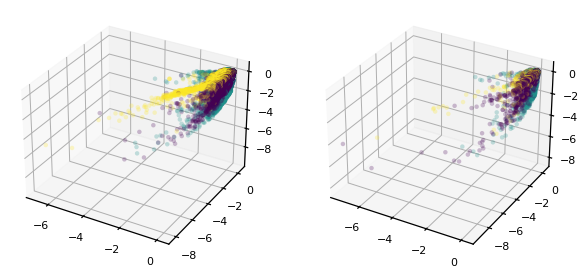

fold 3 completed in 5.83 s


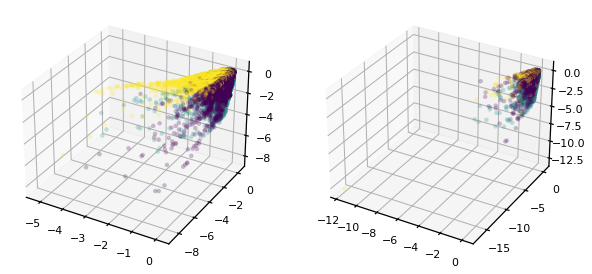

fold 4 completed in 5.67 s


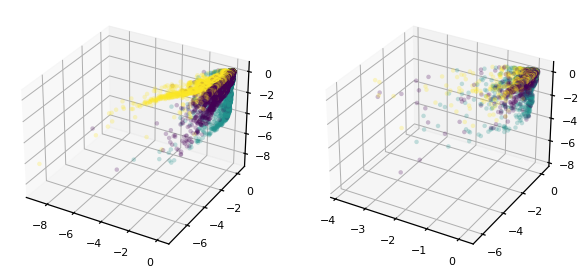

fold 5 completed in 5.86 s
time: 30.1 s


In [6]:
def make_PCA_columns(
    df: pd.DataFrame,
    neg_pca: BaseEstimator,
    neu_pca: BaseEstimator,
    pos_pca: BaseEstimator,
) -> pd.DataFrame:
    """Add the PCA-combo columns"""
    df["LDA-LOF-PCA_neg"] = neg_pca.transform(
        df.loc[:, ["LDA-LOF_neg_10", "LDA-LOF_neg_20", "LDA-LOF_neg_30"]]
    )
    df["LDA-LOF-PCA_neu"] = neu_pca.transform(
        df.loc[:, ["LDA-LOF_neu_10", "LDA-LOF_neu_20", "LDA-LOF_neu_30"]]
    )
    df["LDA-LOF-PCA_pos"] = pos_pca.transform(
        df.loc[:, ["LDA-LOF_pos_10", "LDA-LOF_pos_20", "LDA-LOF_pos_30"]]
    )
    return df


# folds_completed = ()
for fold_num in (0, 1, 2, 3, 4):
    # if fold_num in folds_completed:
    #     continue
    fold_begin = time()

    X_train: pd.DataFrame = pd.read_feather(
        f"{CV_FEATHERS_FOLDER}/cv_{fold_num}/X_train_LDA.feather"
    )
    y_train: pd.Series = pd.read_feather(
        f"{CV_FEATHERS_FOLDER}/cv_{fold_num}/y_train_untransformed.feather"
    ).iloc[:, 0]
    X_test: pd.DataFrame = pd.read_feather(
        f"{CV_FEATHERS_FOLDER}/cv_{fold_num}/X_test_LDA.feather"
    )

    train_LOF_scores, test_LOF_scores = {}, {}
    # extract one feature at a time
    for n_neighbors in (10, 20, 30):
        for emo in ("neg", "neu", "pos"):
            valence = VALENCE[emo]
            key = f"LDA-LOF_{emo}_{n_neighbors}"
            X_train[key] = np.nan
            LOF = LocalOutlierFactor(n_neighbors, novelty=True, n_jobs=-1).fit(
                X_train.loc[y_train == valence, ["LDA1", "LDA2"]].values
            )
            X_train.loc[y_train == valence, key] = LOF.negative_outlier_factor_
            X_train.loc[y_train != valence, key] = LOF.score_samples(
                X_train.loc[y_train != valence, ["LDA1", "LDA2"]]
            )
            train_LOF_scores[key] = X_train.pop(key)
            test_LOF_scores[key] = LOF.score_samples(X_test)
            del LOF
            del valence
            del key
            _ = gc_collect()
    del X_train
    del X_test
    _ = gc_collect()

    # collect train scores
    df = pd.concat(train_LOF_scores, axis="columns")
    del train_LOF_scores
    _ = gc_collect()

    # PCA-reduce columns with same valence
    make_PCA = lambda: PCA(n_components=1, random_state=SEED)
    selector = lambda emo: [f"LDA-LOF_{emo}_{k}" for k in (10, 20, 30)]
    neg_pca = make_PCA().fit(df[selector("neg")])
    neu_pca = make_PCA().fit(df[selector("neu")])
    pos_pca = make_PCA().fit(df[selector("pos")])
    del make_PCA
    del selector
    _ = gc_collect()

    # save train data
    make_PCA_columns(df, neg_pca, neu_pca, pos_pca).to_feather(
        f"{DATA_OUT_FOLDER}/cv_{fold_num}/X_train_LDA-LOF_scores.feather"
    )

    # collect & process test scores
    make_PCA_columns(
        pd.DataFrame(test_LOF_scores), neg_pca, neu_pca, pos_pca
    ).to_feather(f"{DATA_OUT_FOLDER}/cv_{fold_num}/X_test_LDA-LOF_scores.feather")
    del test_LOF_scores
    _ = gc_collect()

    fig = plt.figure(figsize=(10, 10))
    df = pd.read_feather(f"./cv_{fold_num}/X_train_LDA-LOF_scores.feather")
    ax = fig.add_subplot(121, projection="3d")
    ax.scatter(
        df["LDA-LOF-PCA_neg"],
        df["LDA-LOF-PCA_neu"],
        df["LDA-LOF-PCA_pos"],
        alpha=0.25,
        linewidth=0,
        cmap="viridis",
        c=y_train,
    )
    del y_train
    _ = gc_collect()
    df = pd.read_feather(f"./cv_{fold_num}/X_test_LDA-LOF_scores.feather")
    ax = fig.add_subplot(122, projection="3d")
    ax.scatter(
        df["LDA-LOF-PCA_neg"],
        df["LDA-LOF-PCA_neu"],
        df["LDA-LOF-PCA_pos"],
        alpha=0.25,
        linewidth=0,
        cmap="viridis",
        c=pd.read_feather(f"./cv_{fold_num}/y_test_untransformed.feather"),
    )
    plt.show()

    print(f"fold {fold_num + 1} completed in {time() - fold_begin:.2f} s")
    del fold_begin
    _ = gc_collect()

    fold_num += 1

## SGDOneClassSGD

reading data...
extracting one-class scores of FRILL embeddings...
-- Epoch 1
Norm: 2.37, NNZs: 2048, Bias: -3.007663, T: 38352, Avg. loss: 0.439099
Total training time: 0.17 seconds.
-- Epoch 2
Norm: 2.40, NNZs: 2048, Bias: -3.074200, T: 76704, Avg. loss: 0.471128
Total training time: 0.37 seconds.
-- Epoch 3
Norm: 2.42, NNZs: 2048, Bias: -3.107342, T: 115056, Avg. loss: 0.482121
Total training time: 0.56 seconds.
-- Epoch 4
Norm: 2.43, NNZs: 2048, Bias: -3.131620, T: 153408, Avg. loss: 0.485212
Total training time: 0.75 seconds.
-- Epoch 5
Norm: 2.44, NNZs: 2048, Bias: -3.148286, T: 191760, Avg. loss: 0.491387
Total training time: 0.95 seconds.
-- Epoch 6
Norm: 2.44, NNZs: 2048, Bias: -3.161920, T: 230112, Avg. loss: 0.493204
Total training time: 1.14 seconds.
Convergence after 6 epochs took 1.14 seconds
-- Epoch 1
Norm: 2.24, NNZs: 2048, Bias: -2.291467, T: 19836, Avg. loss: 0.324826
Total training time: 0.09 seconds.
-- Epoch 2
Norm: 2.26, NNZs: 2048, Bias: -2.329755, T: 39672, Avg

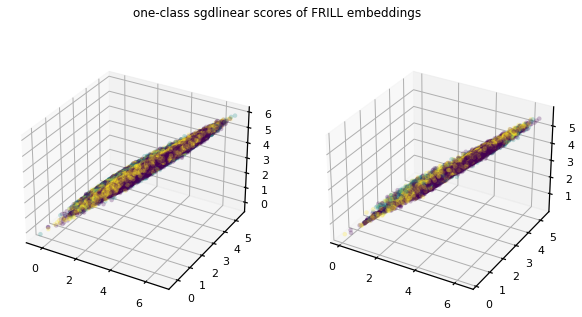

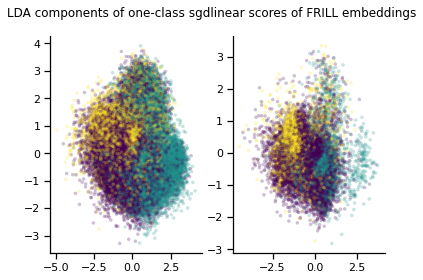

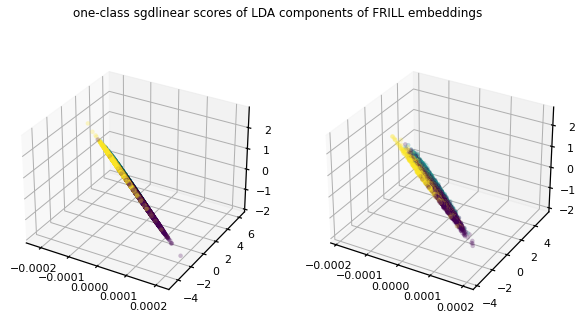

fold 1 completed in 20.82 s
reading data...
extracting one-class scores of FRILL embeddings...
-- Epoch 1
Norm: 2.39, NNZs: 2048, Bias: -3.039677, T: 39604, Avg. loss: 0.461080
Total training time: 0.18 seconds.
-- Epoch 2
Norm: 2.41, NNZs: 2048, Bias: -3.099587, T: 79208, Avg. loss: 0.488042
Total training time: 0.38 seconds.
-- Epoch 3
Norm: 2.43, NNZs: 2048, Bias: -3.130457, T: 118812, Avg. loss: 0.497910
Total training time: 0.57 seconds.
-- Epoch 4
Norm: 2.44, NNZs: 2048, Bias: -3.151053, T: 158416, Avg. loss: 0.502395
Total training time: 0.77 seconds.
-- Epoch 5
Norm: 2.44, NNZs: 2048, Bias: -3.166131, T: 198020, Avg. loss: 0.506194
Total training time: 0.95 seconds.
-- Epoch 6
Norm: 2.45, NNZs: 2048, Bias: -3.178284, T: 237624, Avg. loss: 0.508032
Total training time: 1.14 seconds.
Convergence after 6 epochs took 1.14 seconds
-- Epoch 1
Norm: 2.24, NNZs: 2048, Bias: -2.277071, T: 19997, Avg. loss: 0.318811
Total training time: 0.09 seconds.
-- Epoch 2
Norm: 2.25, NNZs: 2048, Bi

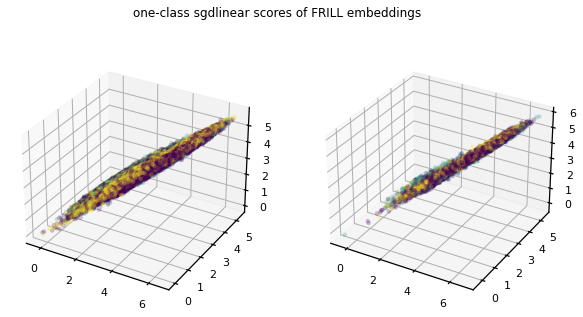

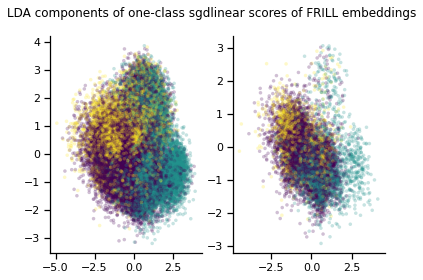

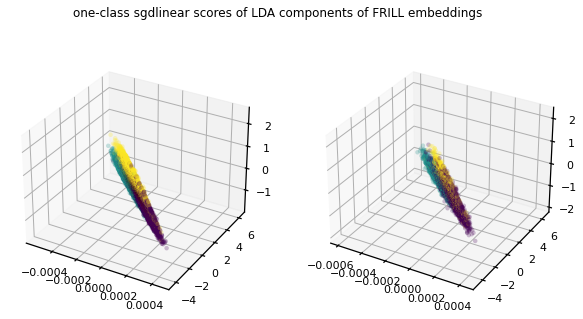

fold 2 completed in 21.18 s
reading data...
extracting one-class scores of FRILL embeddings...
-- Epoch 1
Norm: 2.46, NNZs: 2048, Bias: -3.289188, T: 36142, Avg. loss: 0.488111
Total training time: 0.18 seconds.
-- Epoch 2
Norm: 2.48, NNZs: 2048, Bias: -3.350516, T: 72284, Avg. loss: 0.518987
Total training time: 0.36 seconds.
-- Epoch 3
Norm: 2.50, NNZs: 2048, Bias: -3.384324, T: 108426, Avg. loss: 0.525855
Total training time: 0.52 seconds.
-- Epoch 4
Norm: 2.51, NNZs: 2048, Bias: -3.405011, T: 144568, Avg. loss: 0.531743
Total training time: 0.70 seconds.
-- Epoch 5
Norm: 2.51, NNZs: 2048, Bias: -3.421152, T: 180710, Avg. loss: 0.535478
Total training time: 0.87 seconds.
-- Epoch 6
Norm: 2.52, NNZs: 2048, Bias: -3.433826, T: 216852, Avg. loss: 0.538233
Total training time: 1.06 seconds.
Convergence after 6 epochs took 1.06 seconds
-- Epoch 1
Norm: 2.22, NNZs: 2048, Bias: -2.395384, T: 17257, Avg. loss: 0.346765
Total training time: 0.08 seconds.
-- Epoch 2
Norm: 2.24, NNZs: 2048, Bi

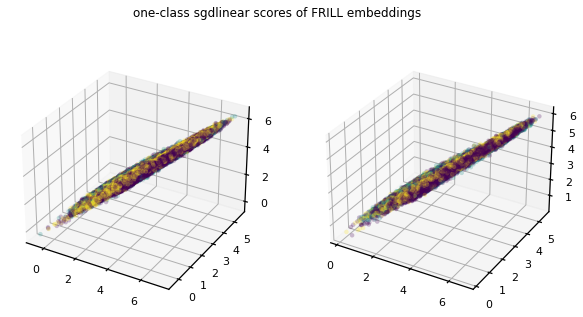

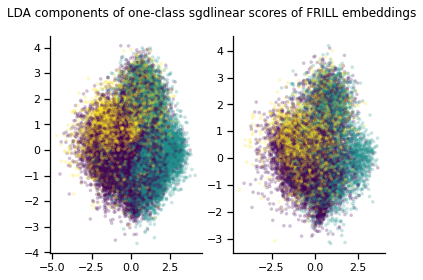

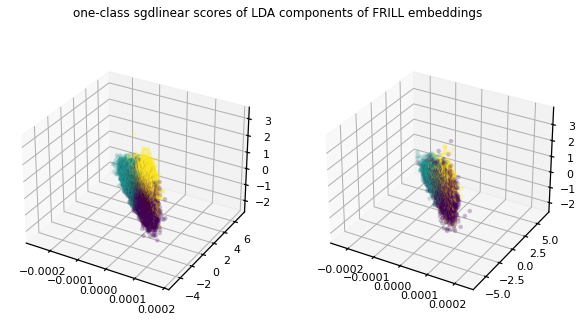

fold 3 completed in 20.39 s
reading data...
extracting one-class scores of FRILL embeddings...
-- Epoch 1
Norm: 2.33, NNZs: 2048, Bias: -2.938458, T: 32169, Avg. loss: 0.438291
Total training time: 0.21 seconds.
-- Epoch 2
Norm: 2.36, NNZs: 2048, Bias: -3.014842, T: 64338, Avg. loss: 0.477970
Total training time: 0.39 seconds.
-- Epoch 3
Norm: 2.38, NNZs: 2048, Bias: -3.053324, T: 96507, Avg. loss: 0.489789
Total training time: 0.56 seconds.
-- Epoch 4
Norm: 2.39, NNZs: 2048, Bias: -3.080557, T: 128676, Avg. loss: 0.494419
Total training time: 0.71 seconds.
-- Epoch 5
Norm: 2.40, NNZs: 2048, Bias: -3.100069, T: 160845, Avg. loss: 0.499597
Total training time: 0.88 seconds.
-- Epoch 6
Norm: 2.41, NNZs: 2048, Bias: -3.115204, T: 193014, Avg. loss: 0.504067
Total training time: 1.03 seconds.
Convergence after 6 epochs took 1.03 seconds
-- Epoch 1
Norm: 2.19, NNZs: 2048, Bias: -2.183326, T: 16136, Avg. loss: 0.292158
Total training time: 0.07 seconds.
-- Epoch 2
Norm: 2.22, NNZs: 2048, Bia

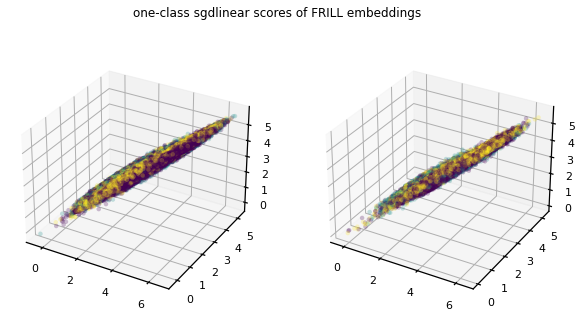

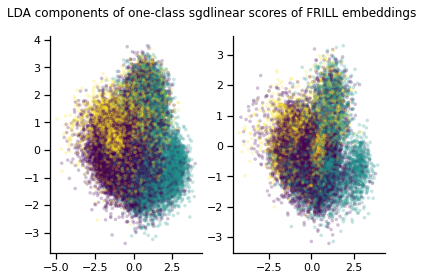

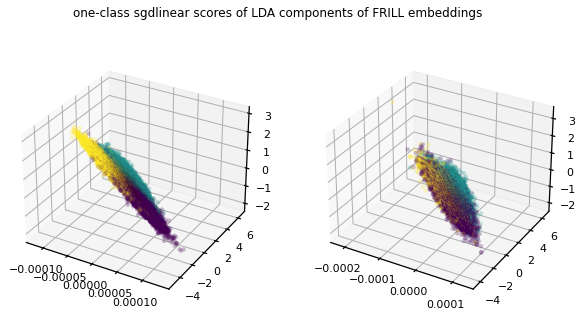

fold 4 completed in 19.67 s
reading data...
extracting one-class scores of FRILL embeddings...
-- Epoch 1
Norm: 2.44, NNZs: 2048, Bias: -3.367664, T: 38613, Avg. loss: 0.456044
Total training time: 0.19 seconds.
-- Epoch 2
Norm: 2.49, NNZs: 2048, Bias: -3.454972, T: 77226, Avg. loss: 0.498970
Total training time: 0.38 seconds.
-- Epoch 3
Norm: 2.51, NNZs: 2048, Bias: -3.501837, T: 115839, Avg. loss: 0.512800
Total training time: 0.58 seconds.
-- Epoch 4
Norm: 2.52, NNZs: 2048, Bias: -3.534861, T: 154452, Avg. loss: 0.518288
Total training time: 0.76 seconds.
-- Epoch 5
Norm: 2.54, NNZs: 2048, Bias: -3.557943, T: 193065, Avg. loss: 0.525776
Total training time: 0.94 seconds.
-- Epoch 6
Norm: 2.54, NNZs: 2048, Bias: -3.576895, T: 231678, Avg. loss: 0.528376
Total training time: 1.14 seconds.
Convergence after 6 epochs took 1.14 seconds
-- Epoch 1
Norm: 2.30, NNZs: 2048, Bias: -2.795703, T: 17226, Avg. loss: 0.421424
Total training time: 0.08 seconds.
-- Epoch 2
Norm: 2.32, NNZs: 2048, Bi

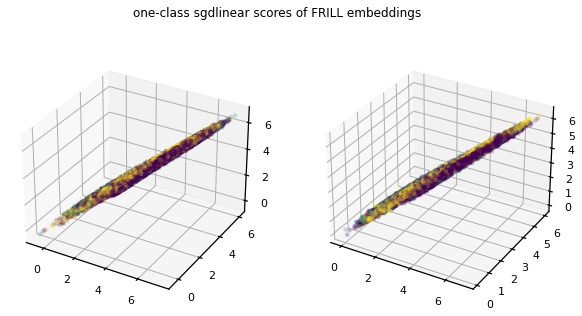

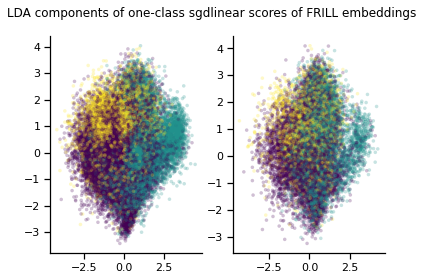

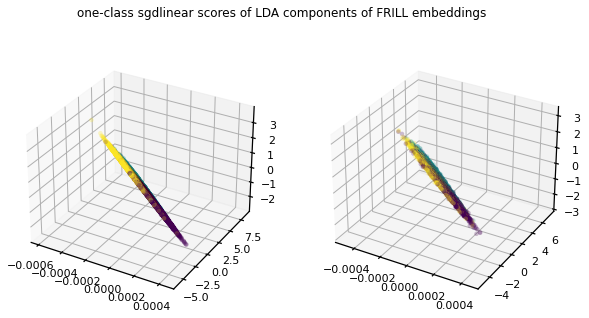

fold 5 completed in 20.59 s
time: 1min 43s


In [6]:
sgdlinear = lambda: SGDOneClassSVM(verbose=1, random_state=SEED)
extract_ocsvm_features(model_base=sgdlinear, descriptor="sgdlinear")
del sgdlinear
_ = gc_collect()

## RBF kernel

reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


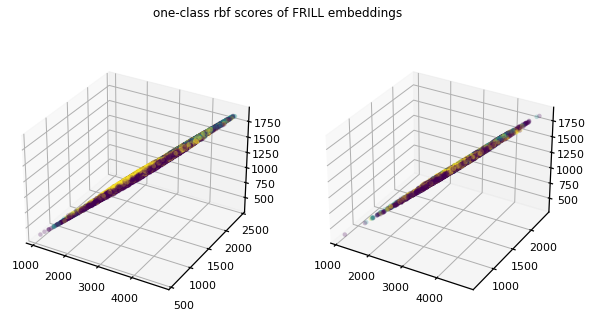

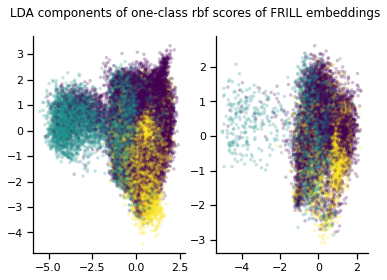

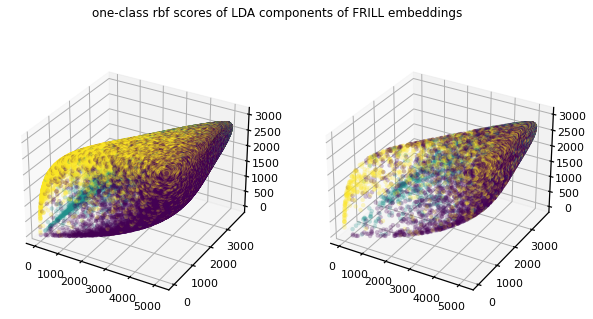

fold 1 completed in 8460.95 s
reading data...
extracting one-class scores of FRILL embeddings...


In [8]:
rbf = lambda: OneClassSVM(kernel="rbf")
extract_ocsvm_features(model_base=rbf, descriptor="rbf")
del rbf
_ = gc_collect()

reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


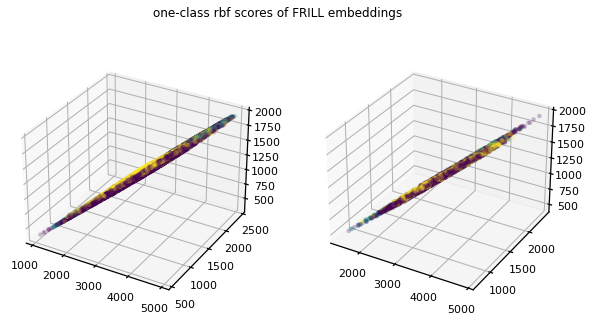

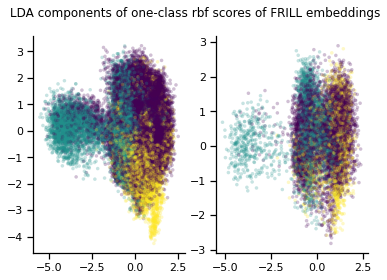

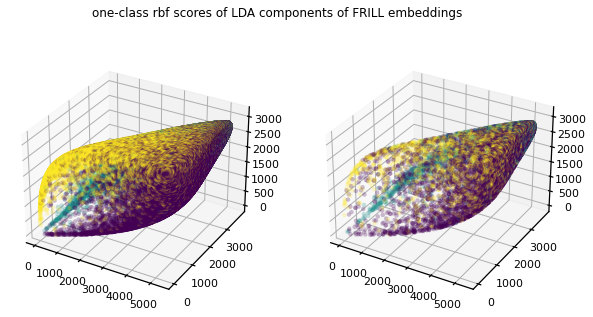

fold 2 completed in 8710.48 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


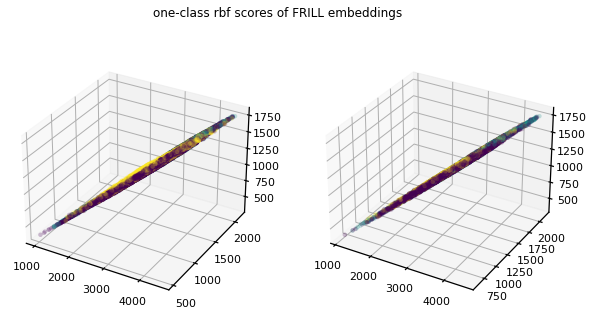

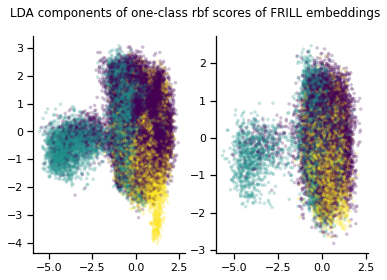

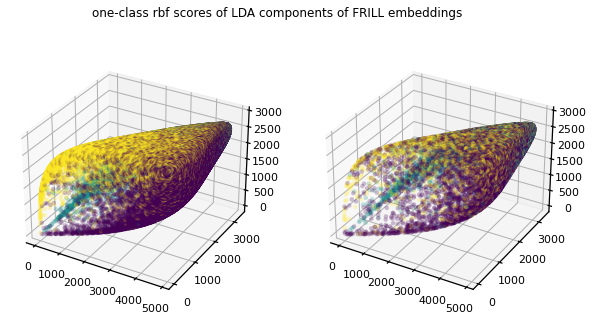

fold 3 completed in 7761.71 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


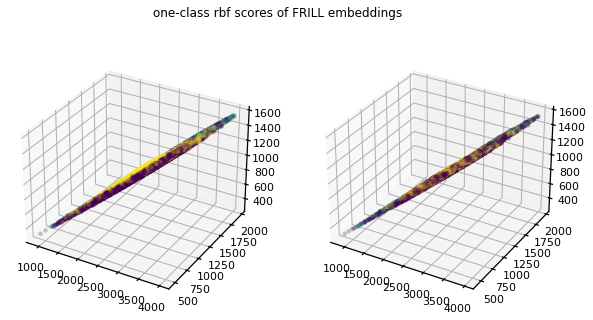

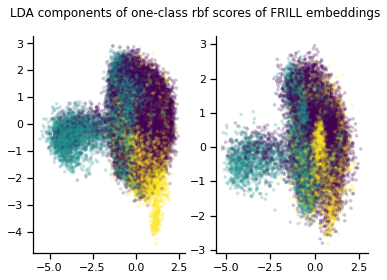

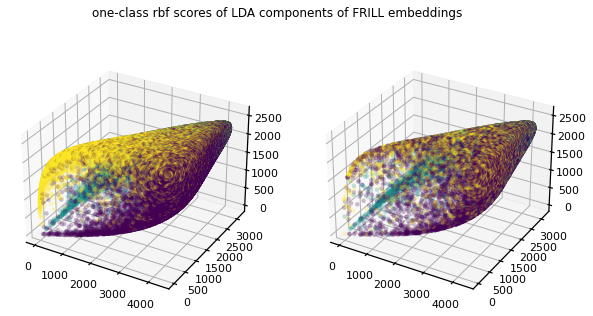

fold 4 completed in 6684.79 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


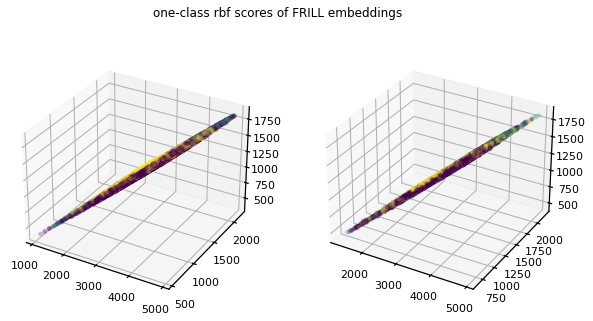

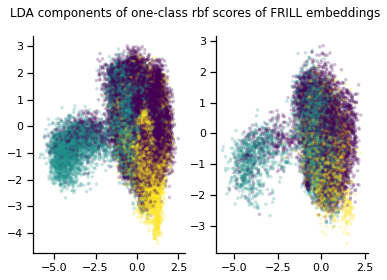

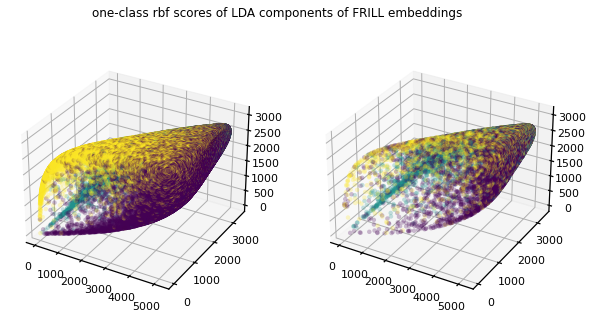

fold 5 completed in 8072.61 s
time: 8h 40min 30s


In [6]:
rbf = lambda: OneClassSVM(kernel="rbf")
extract_ocsvm_features(model_base=rbf, descriptor="rbf", folds_completed=[0])
del rbf
_ = gc_collect()

## Sigmoid kernel

reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


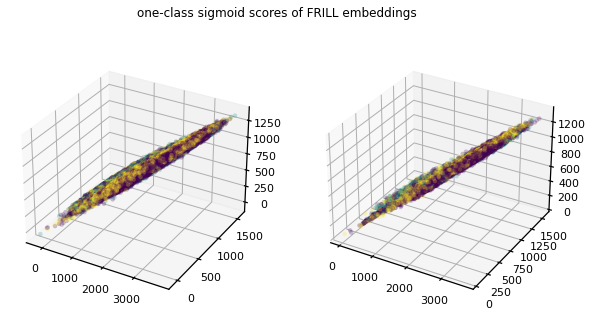

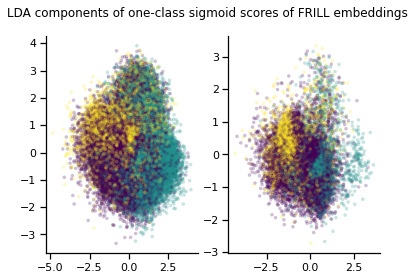

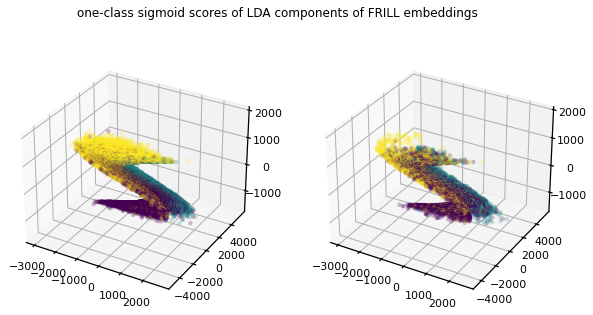

fold 1 completed in 5311.73 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


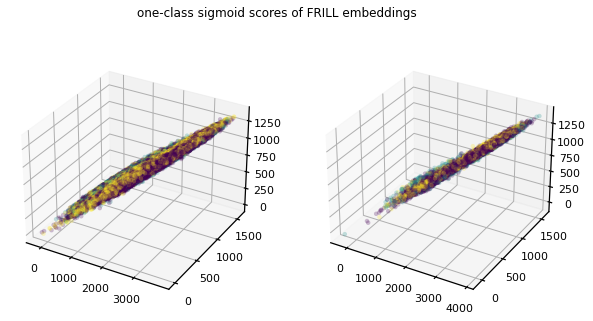

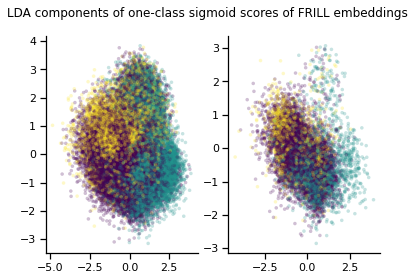

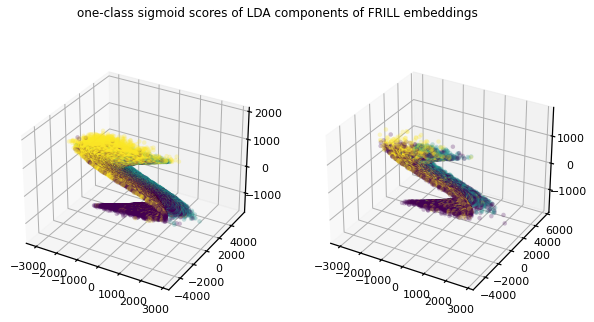

fold 2 completed in 5584.03 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


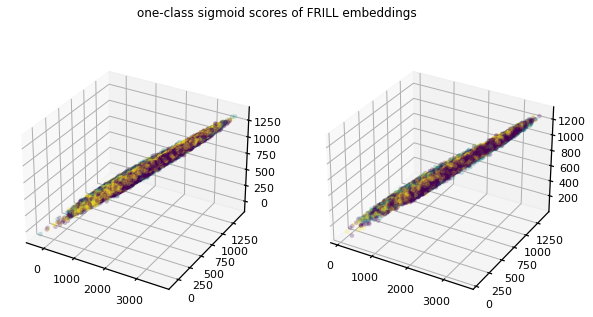

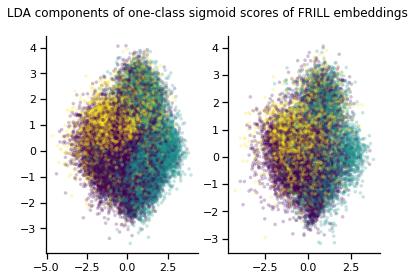

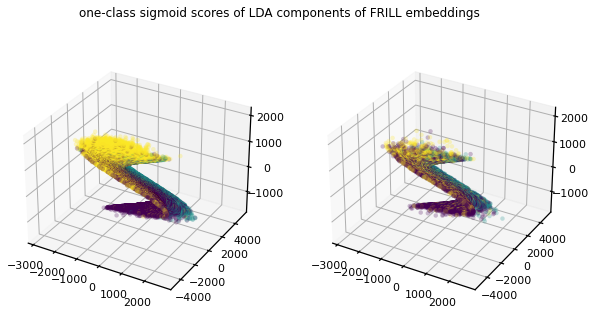

fold 3 completed in 4897.29 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


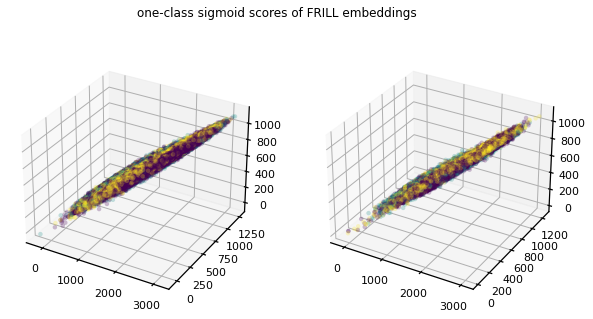

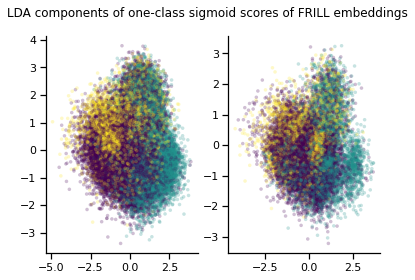

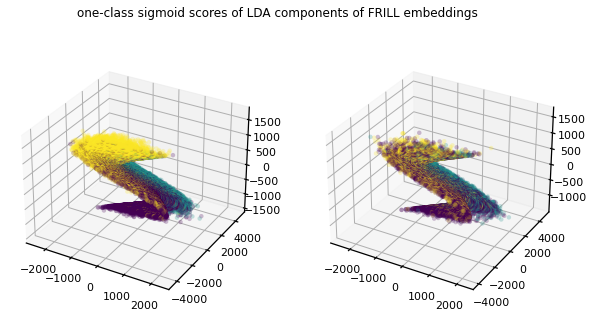

fold 4 completed in 4355.11 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


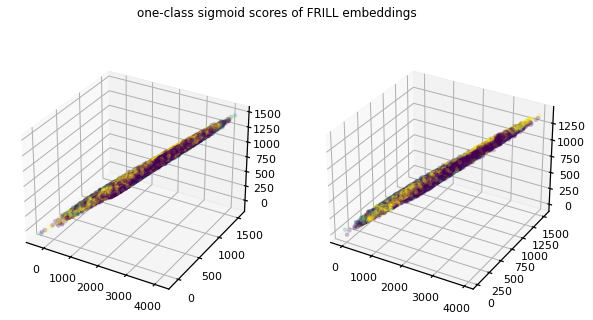

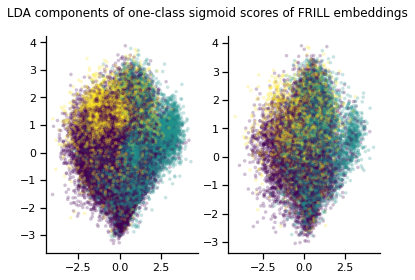

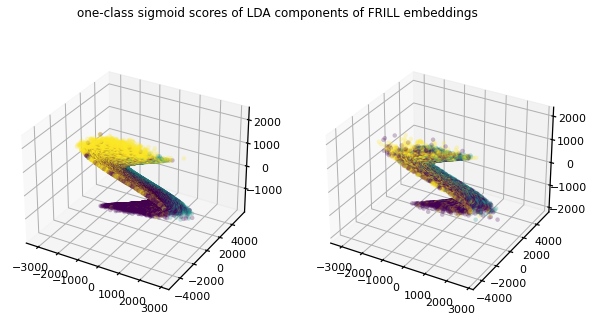

fold 5 completed in 5152.27 s
time: 7h 1min 41s


In [7]:
sigmoid = lambda: OneClassSVM(kernel="sigmoid")
extract_ocsvm_features(model_base=sigmoid, descriptor="sigmoid")
del sigmoid
_ = gc_collect()

## Polynomial kernel

reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


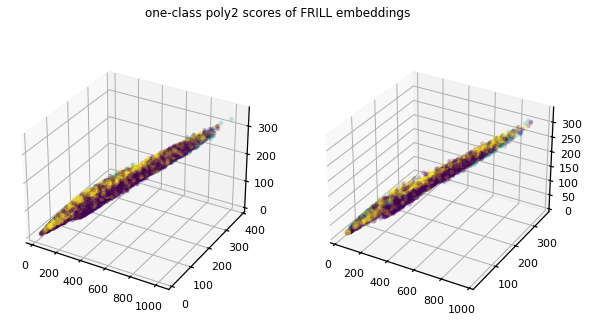

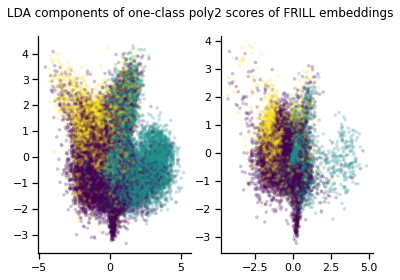

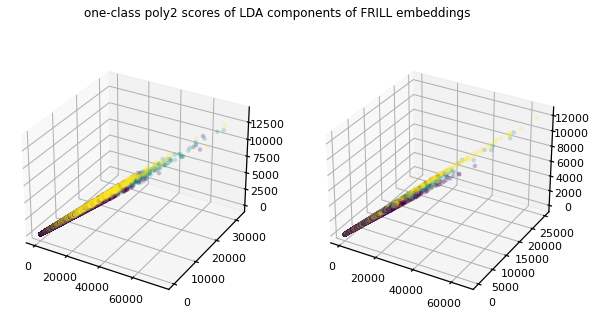

fold 1 completed in 5866.25 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


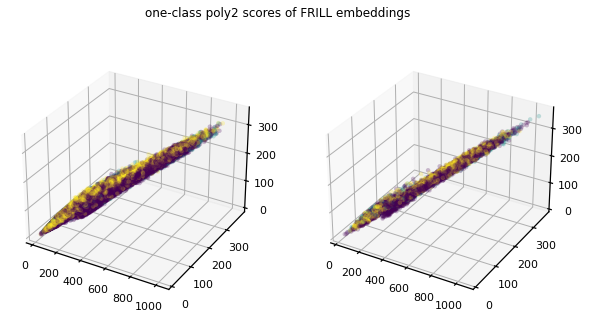

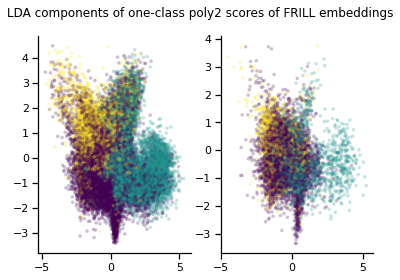

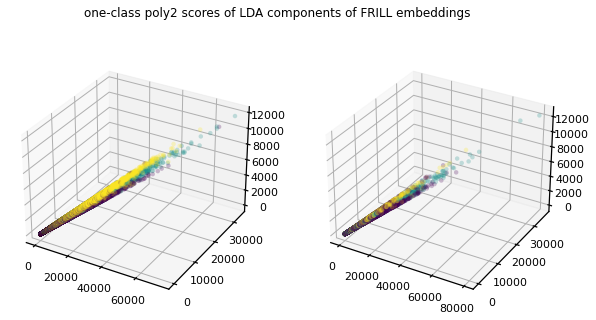

fold 2 completed in 6005.41 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


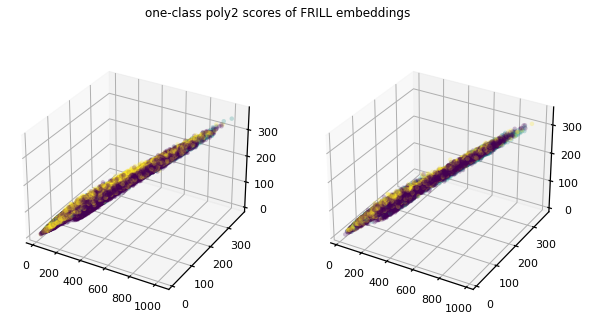

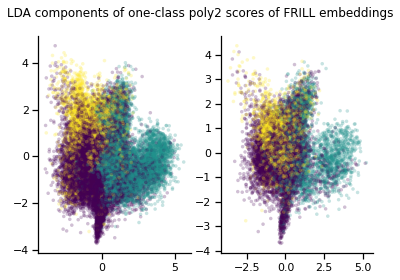

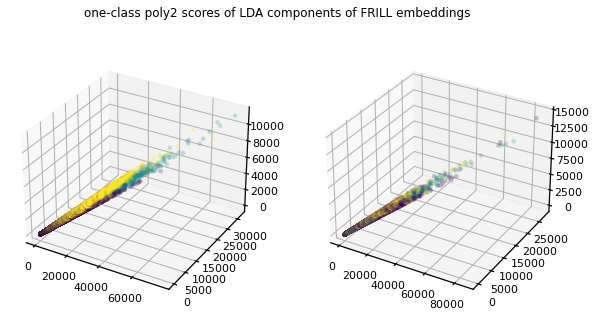

fold 3 completed in 5106.91 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


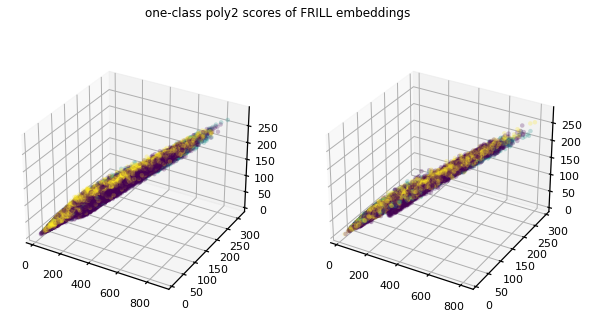

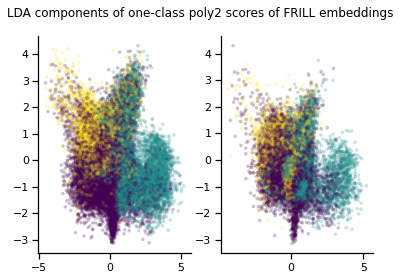

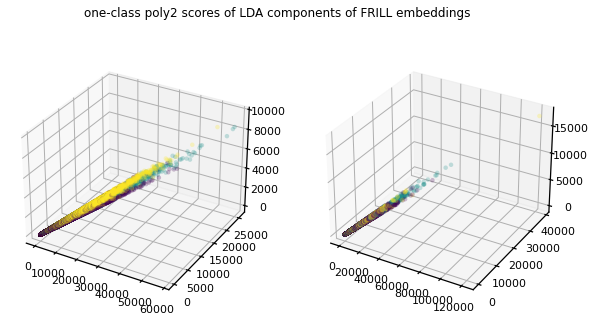

fold 4 completed in 4495.99 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


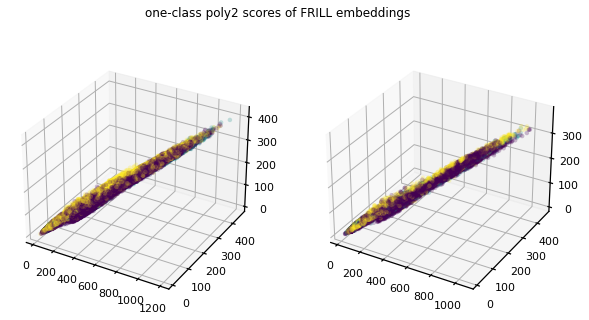

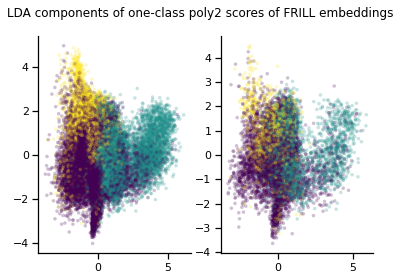

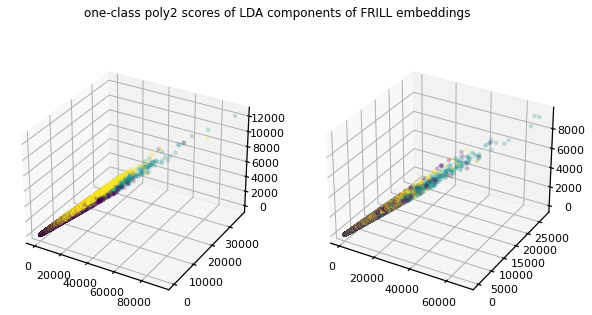

fold 5 completed in 5146.74 s
time: 7h 23min 42s


In [6]:
poly = lambda deg: {
    "model_base": lambda: OneClassSVM(kernel="poly", degree=deg),
    "descriptor": f"poly{deg}",
}
_ = gc_collect()
extract_ocsvm_features(**poly(2))

reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


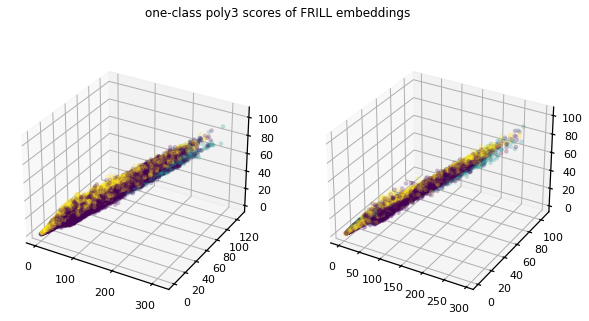

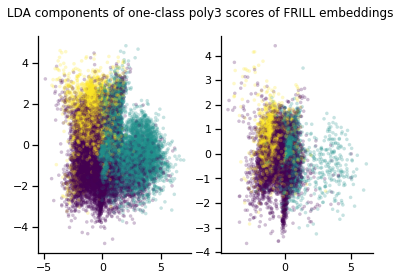

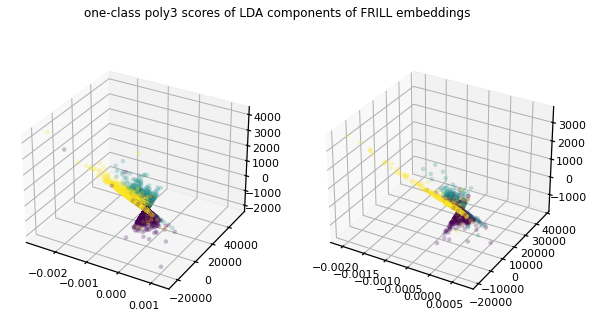

fold 1 completed in 5748.06 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


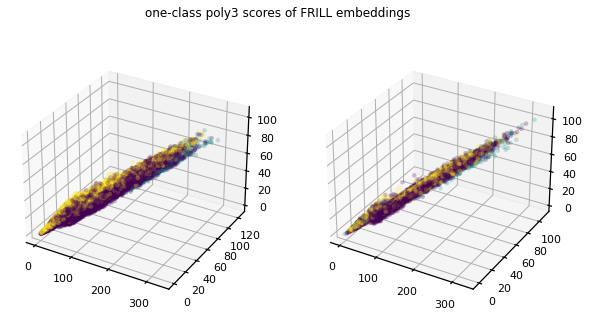

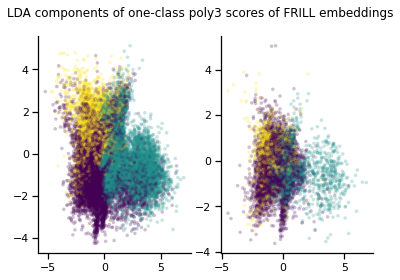

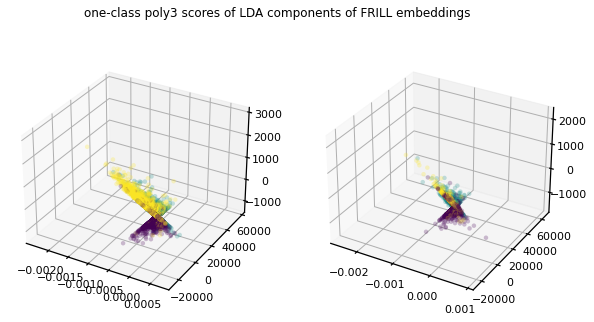

fold 2 completed in 6083.83 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


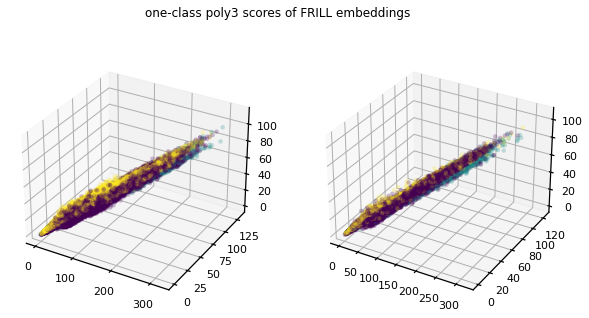

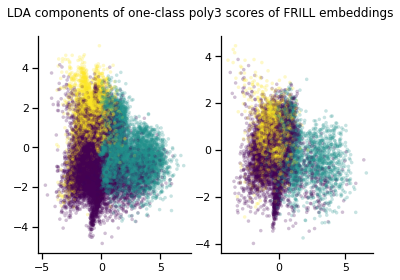

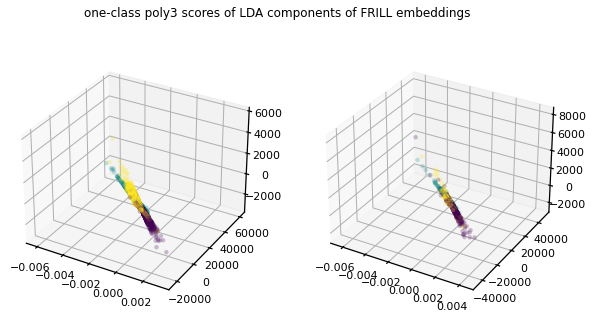

fold 3 completed in 5163.05 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


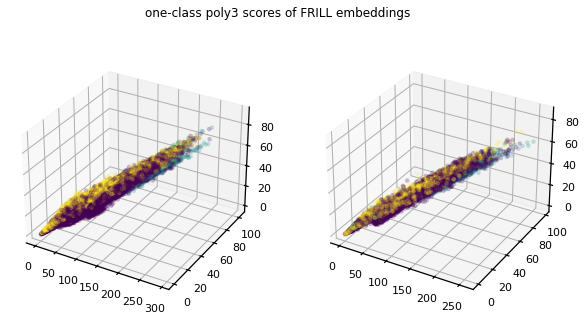

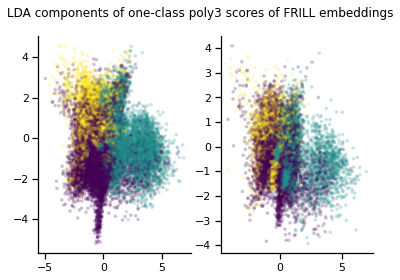

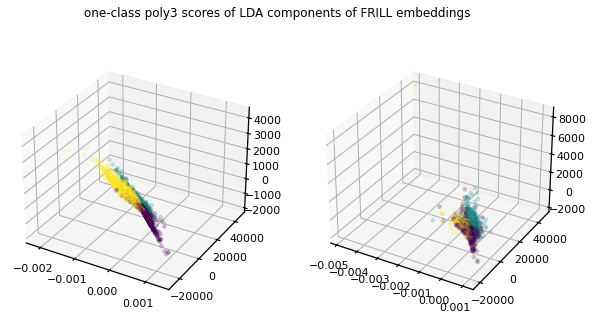

fold 4 completed in 4566.75 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


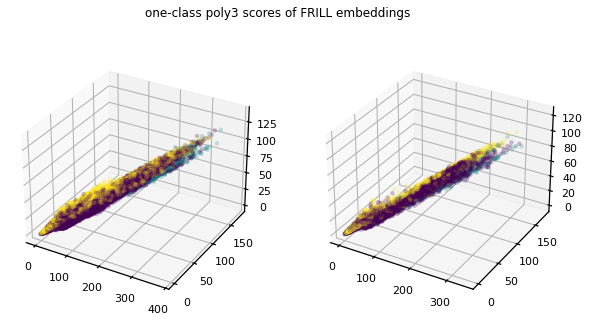

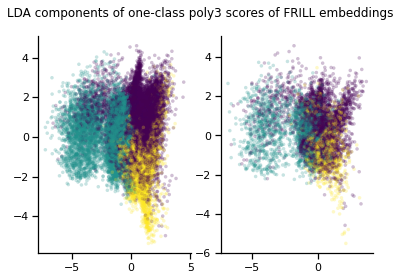

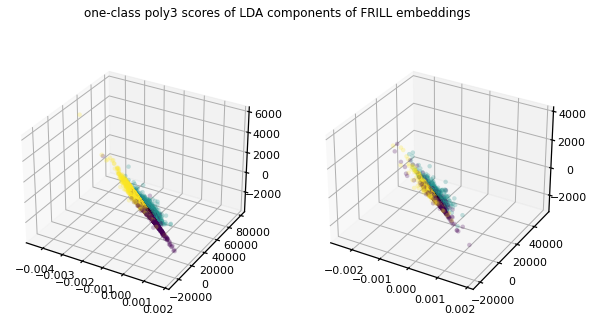

fold 5 completed in 5429.28 s
time: 7h 29min 51s


In [7]:
extract_ocsvm_features(**poly(3))

reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


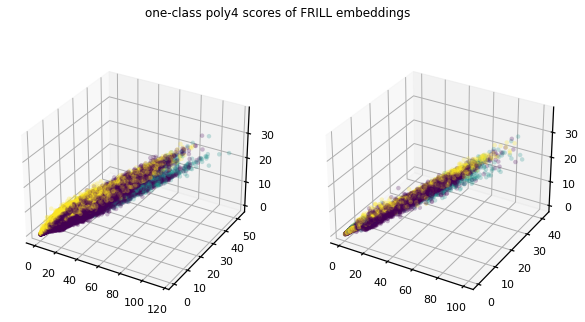

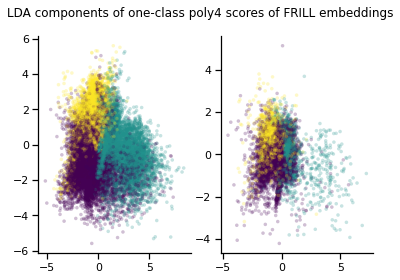

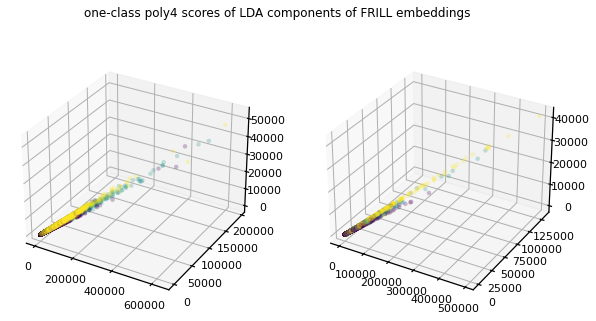

fold 1 completed in 5728.60 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


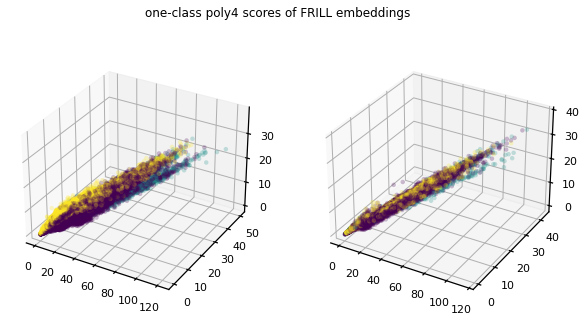

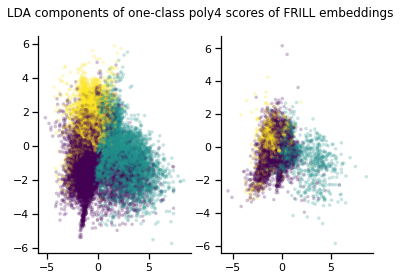

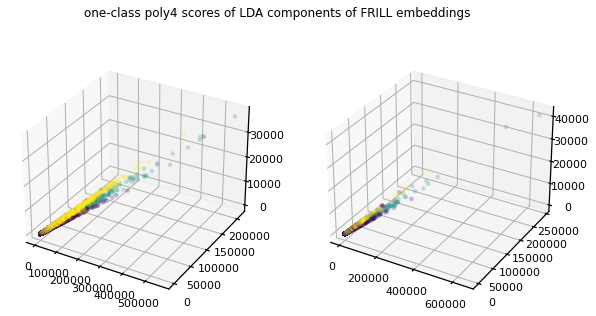

fold 2 completed in 6163.87 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


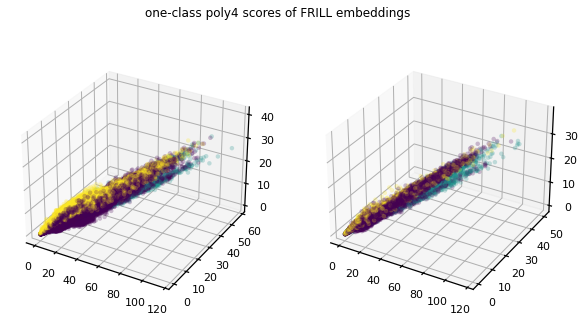

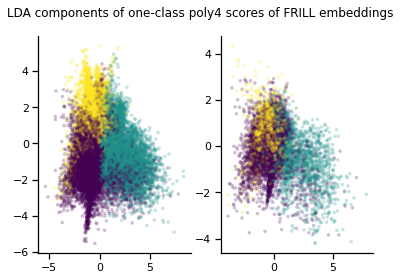

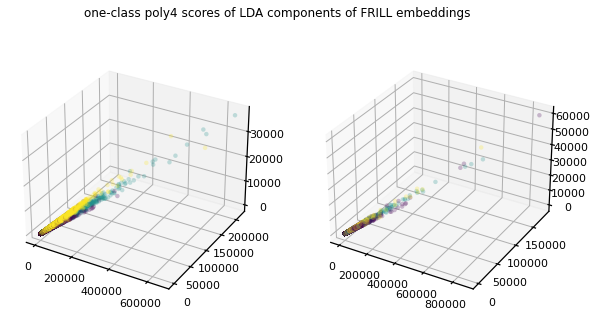

fold 3 completed in 4840.84 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


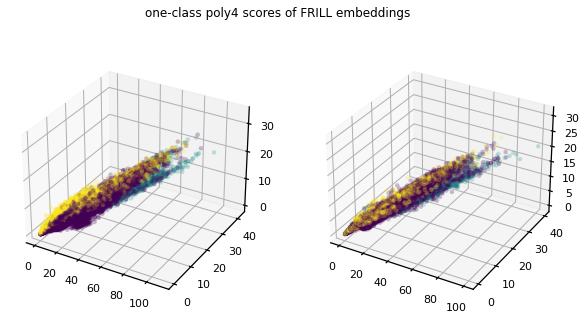

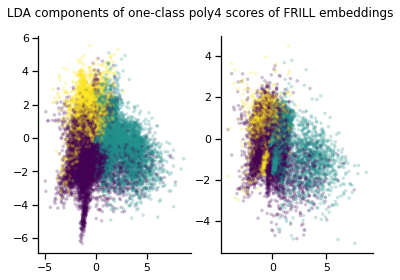

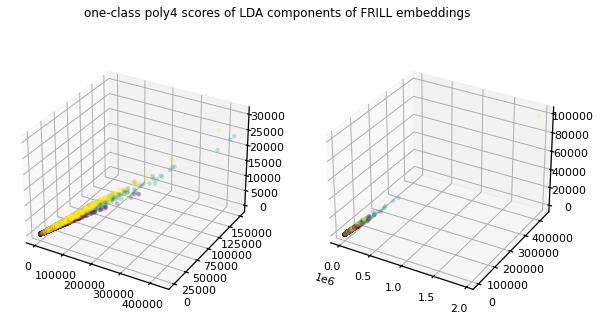

fold 4 completed in 4342.46 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


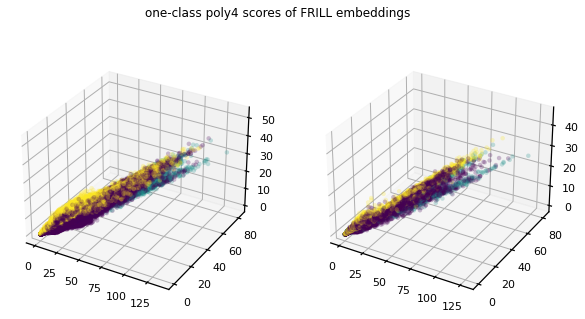

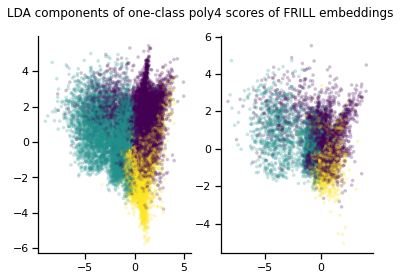

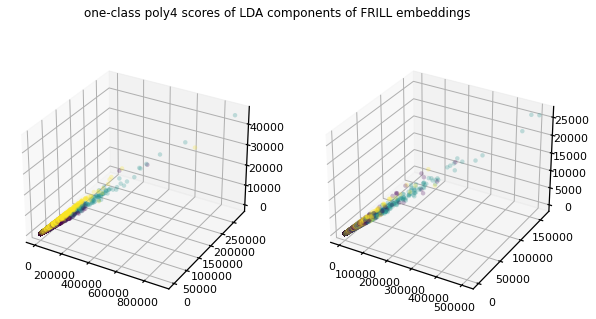

fold 5 completed in 5199.20 s
time: 7h 17min 55s


In [8]:
extract_ocsvm_features(**poly(4))

reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


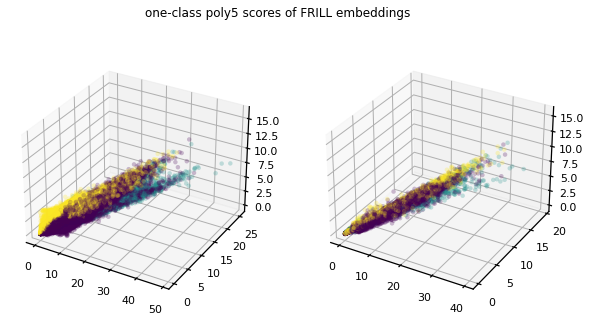

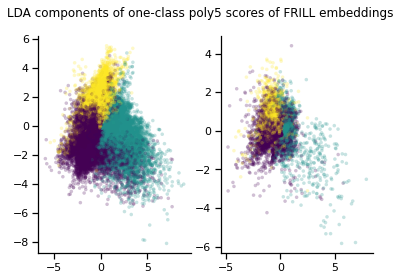

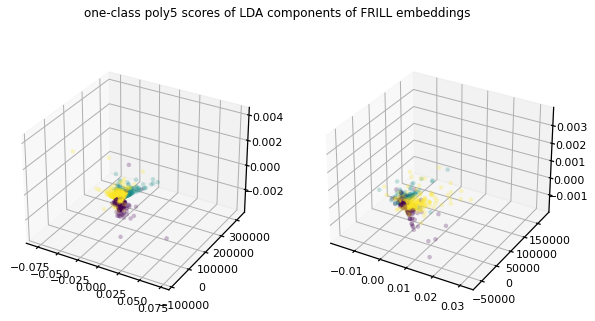

fold 1 completed in 41141.70 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


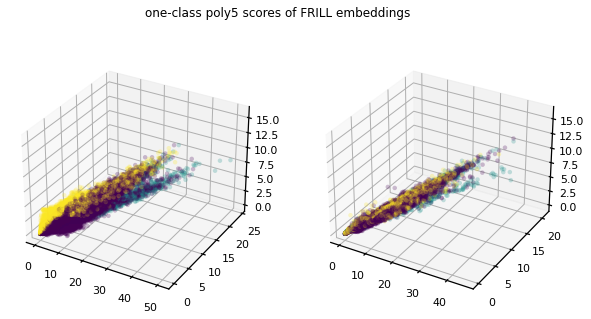

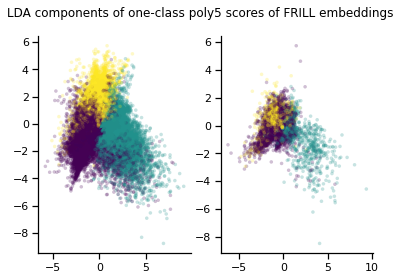

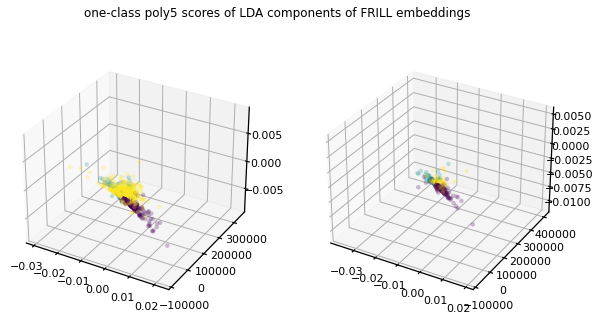

fold 2 completed in 41540.13 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


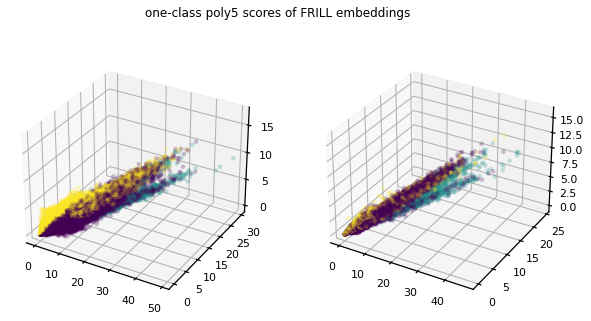

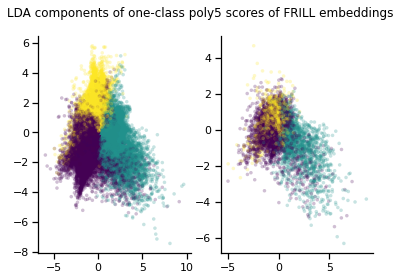

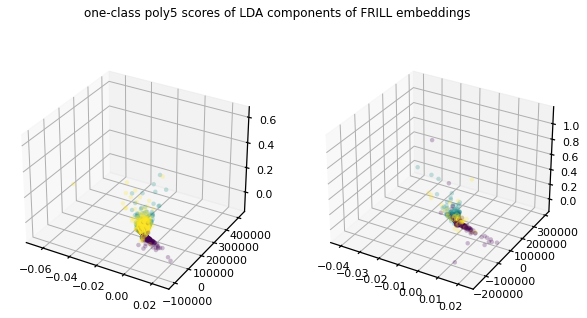

fold 3 completed in 38725.52 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


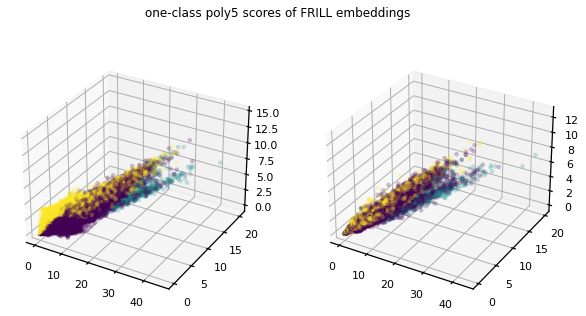

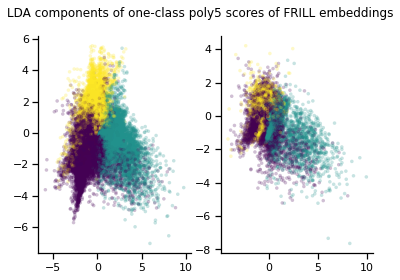

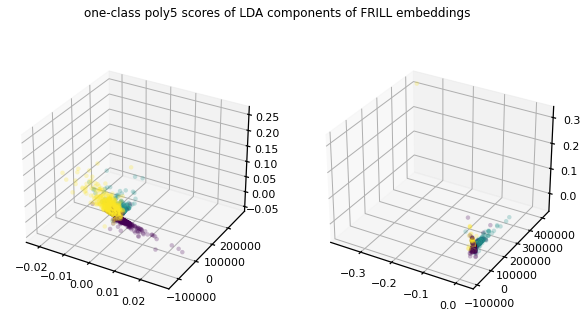

fold 4 completed in 22045.53 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


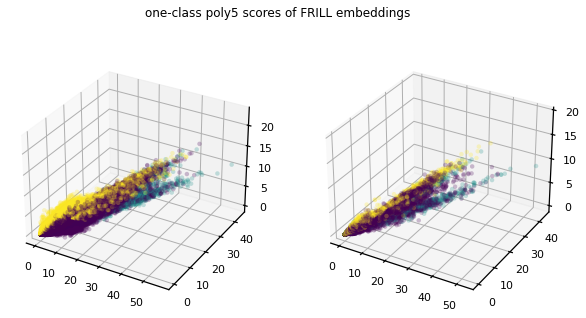

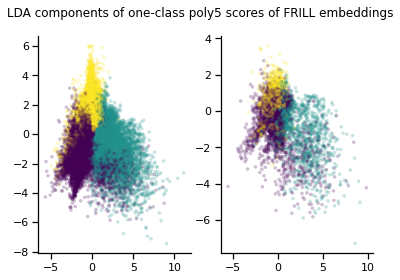

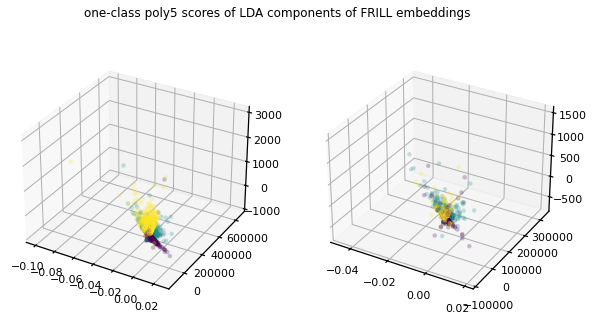

fold 5 completed in 56505.78 s
time: 2d 7h 32min 39s


In [9]:
extract_ocsvm_features(**poly(5))

reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


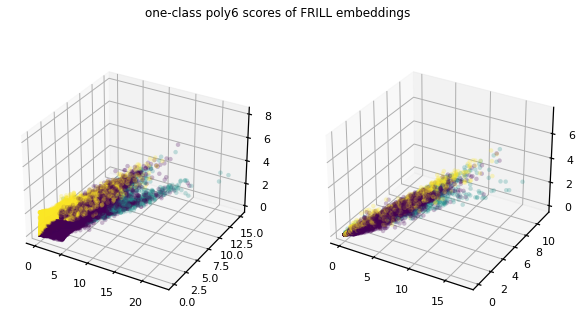

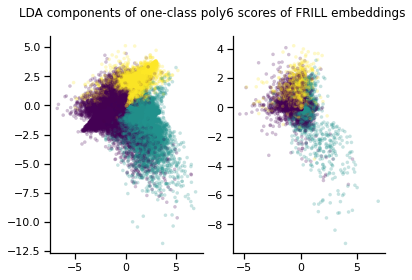

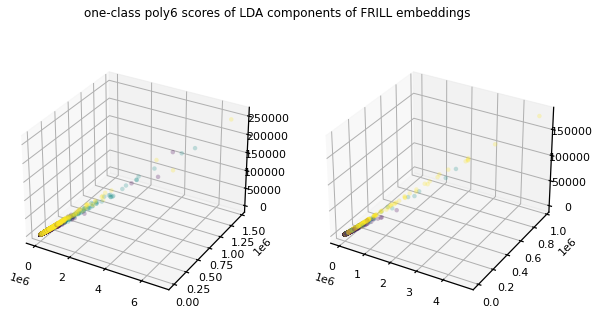

fold 1 completed in 6822.06 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


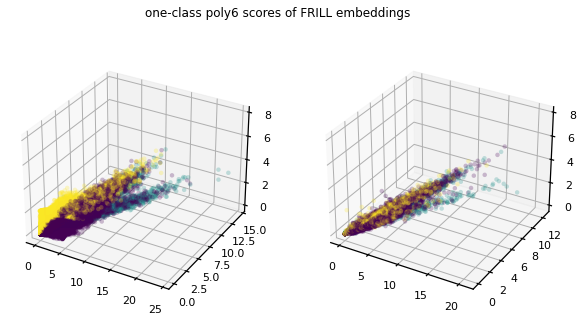

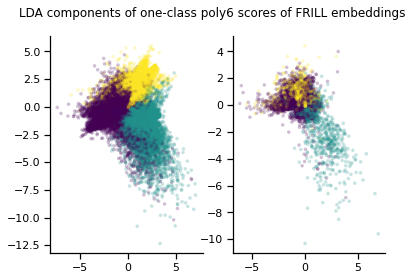

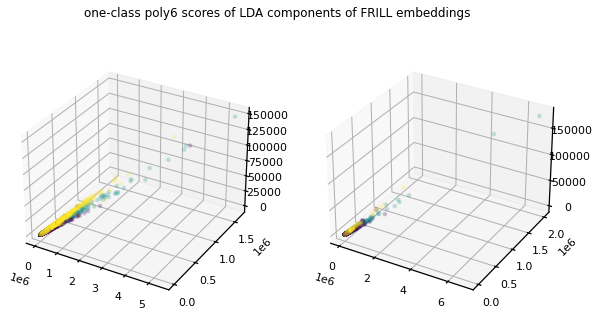

fold 2 completed in 6672.48 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


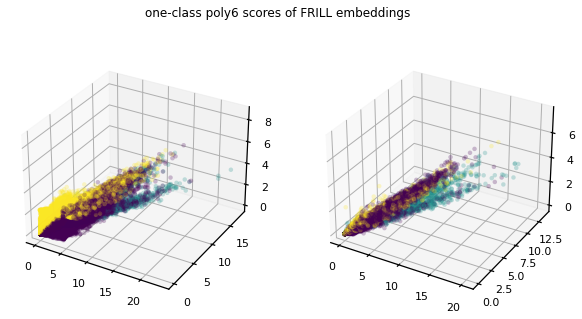

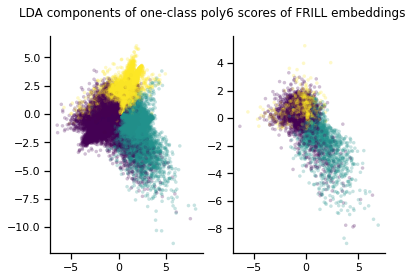

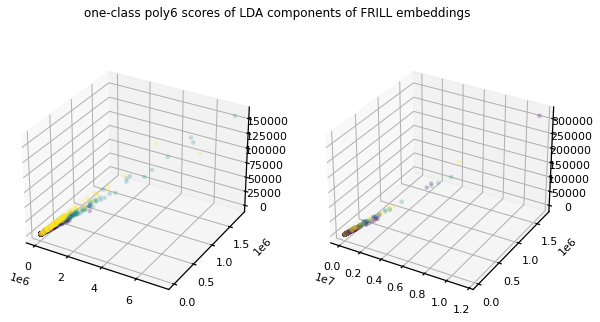

fold 3 completed in 5586.51 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


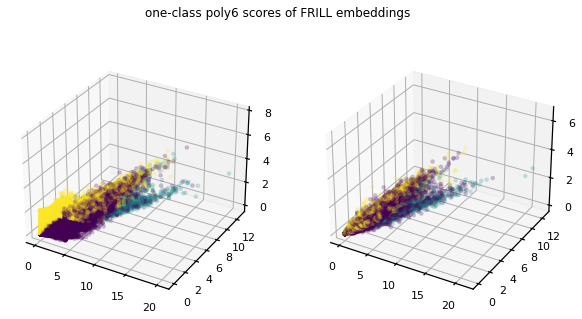

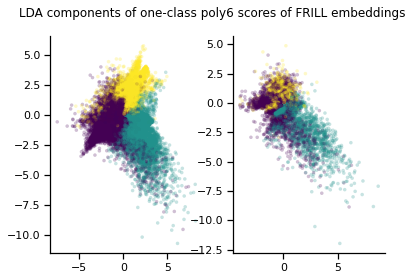

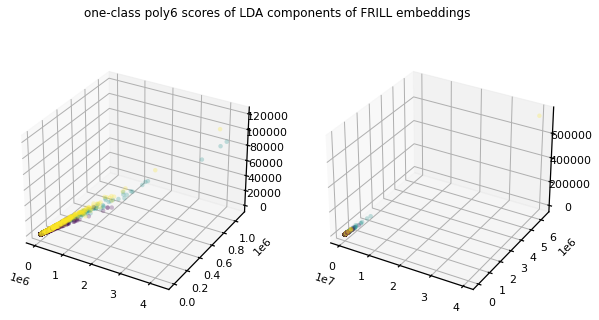

fold 4 completed in 5035.60 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


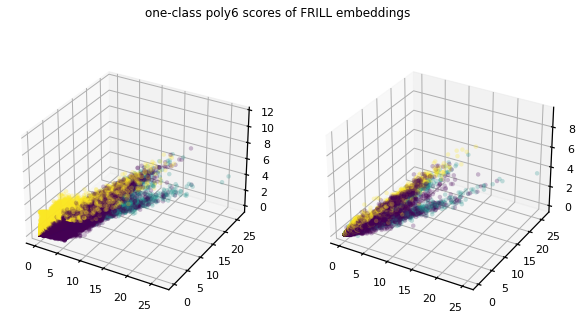

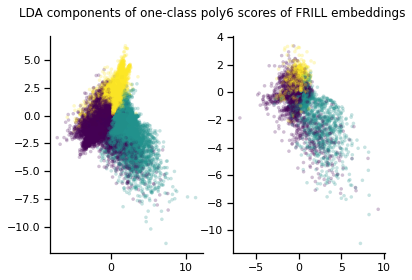

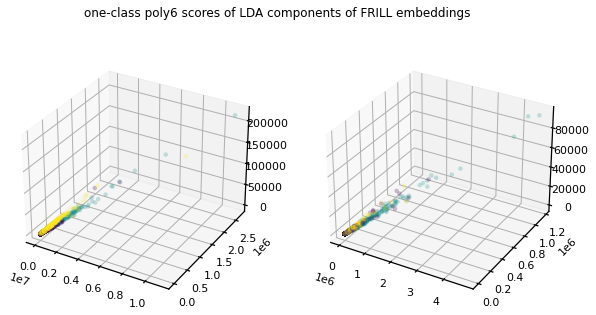

fold 5 completed in 5839.30 s
time: 8h 19min 16s


In [10]:
extract_ocsvm_features(**poly(6))

reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


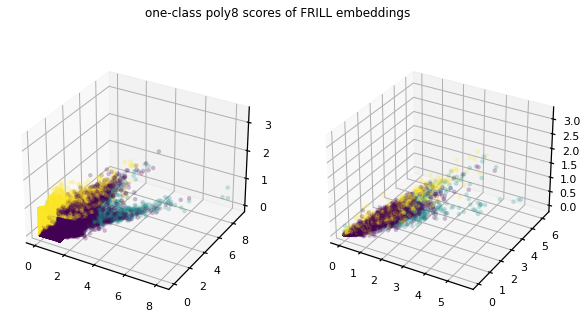

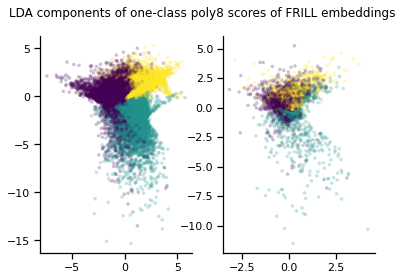

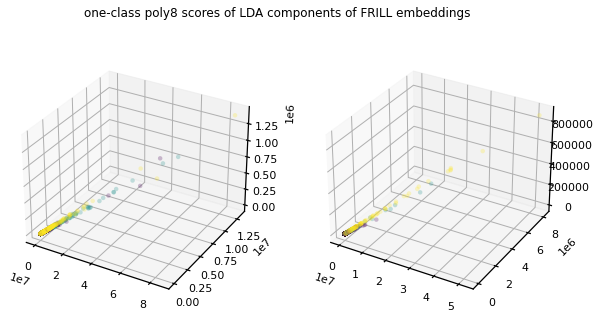

fold 1 completed in 9373.11 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


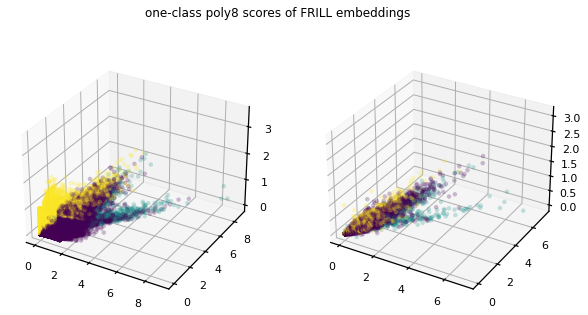

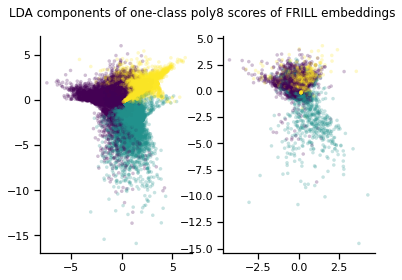

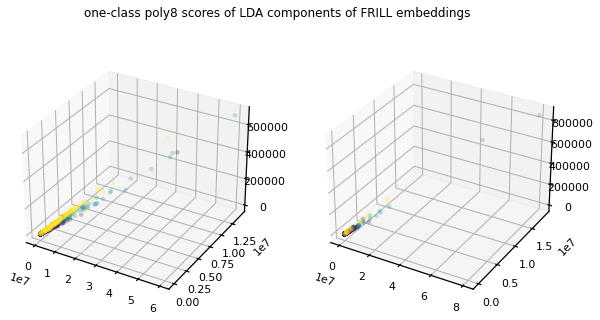

fold 2 completed in 9787.83 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


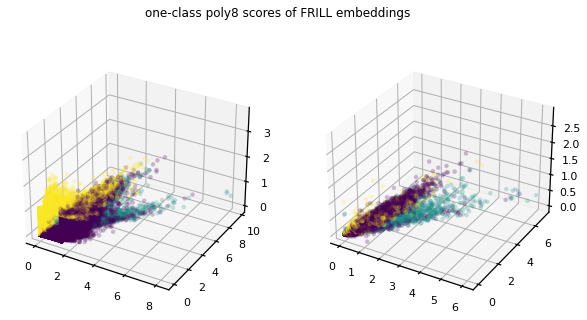

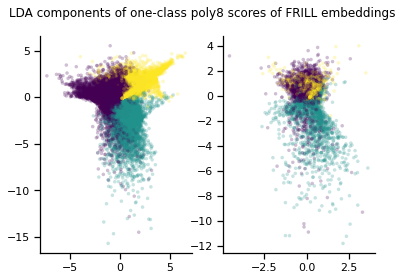

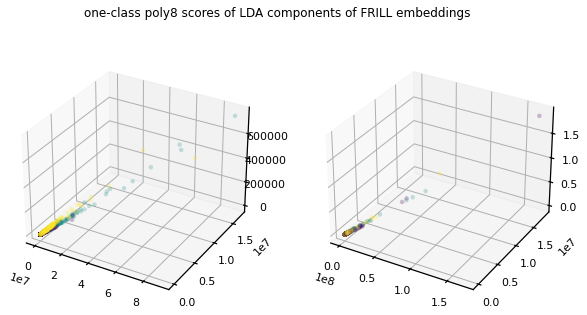

fold 3 completed in 8236.16 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


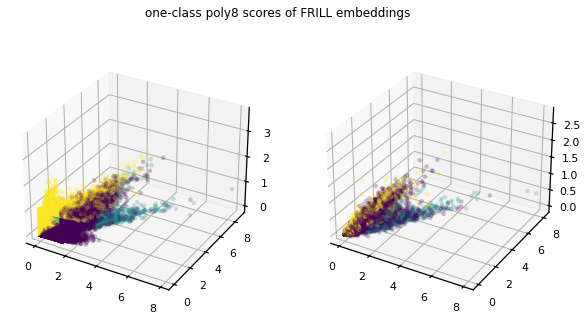

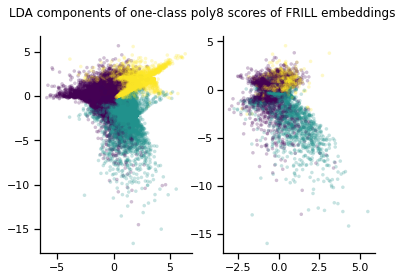

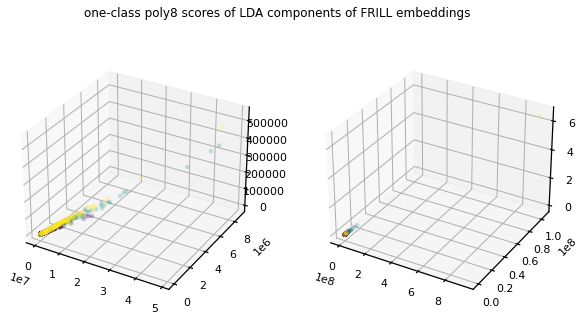

fold 4 completed in 7586.92 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


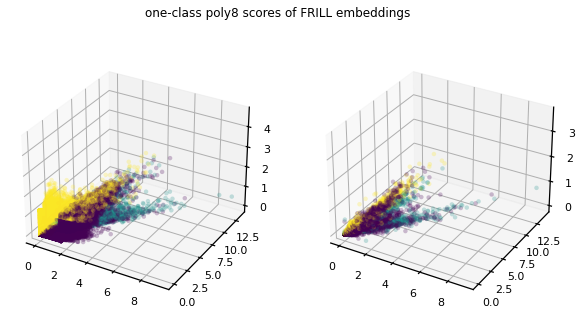

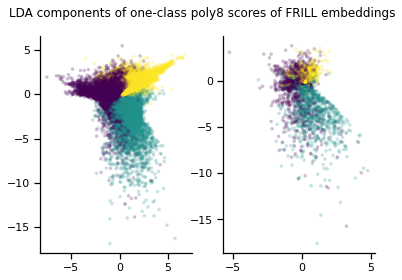

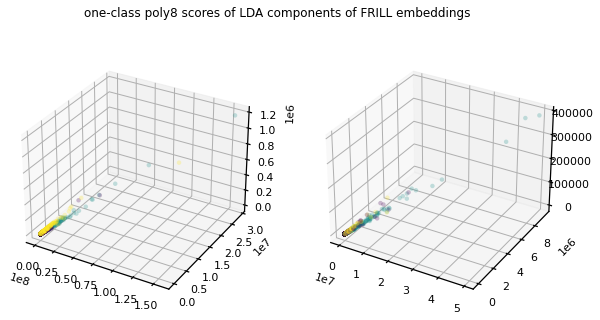

fold 5 completed in 8886.77 s
time: 12h 11min 11s


In [11]:
extract_ocsvm_features(**poly(8))

reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


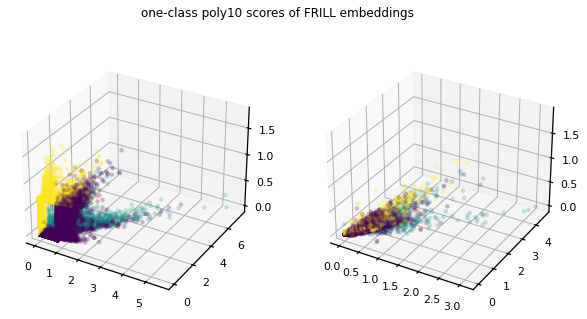

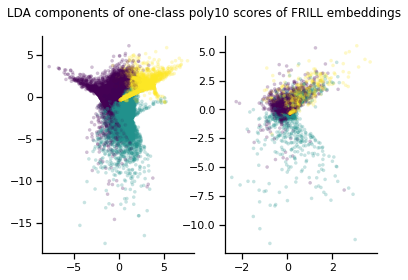

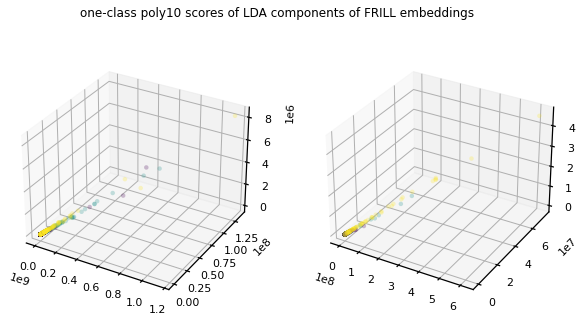

fold 1 completed in 12406.88 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


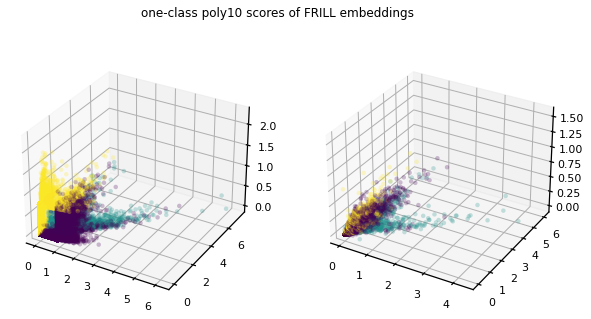

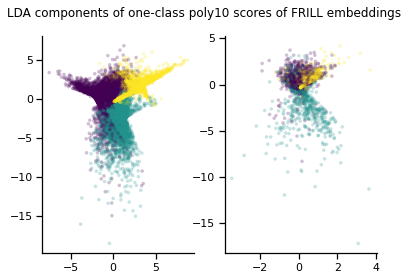

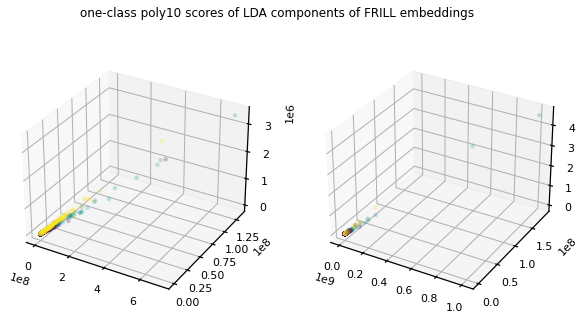

fold 2 completed in 12812.56 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


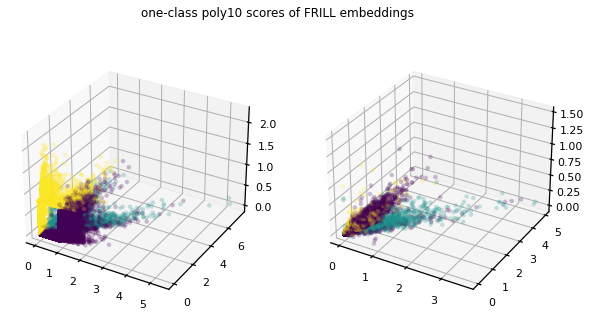

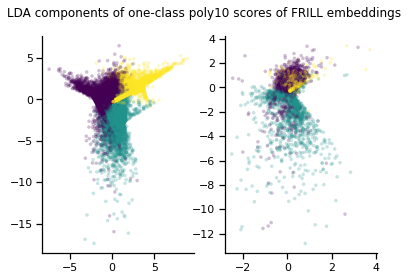

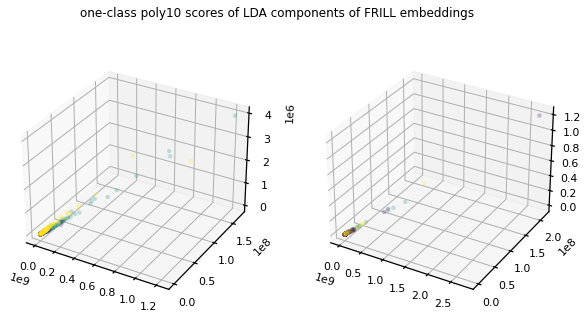

fold 3 completed in 10521.85 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


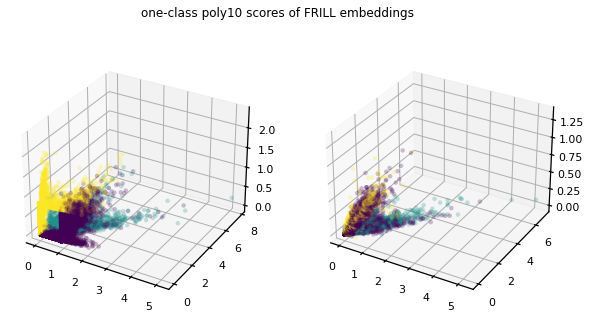

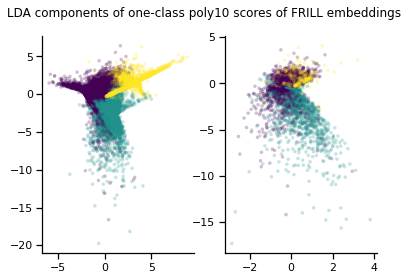

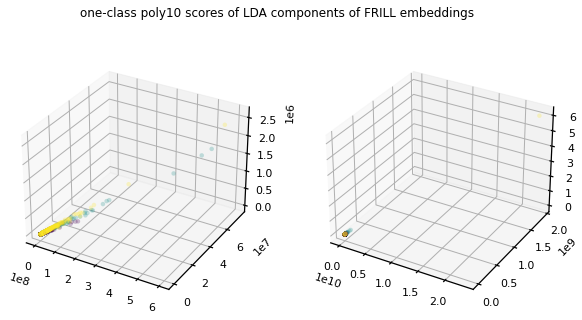

fold 4 completed in 8764.29 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


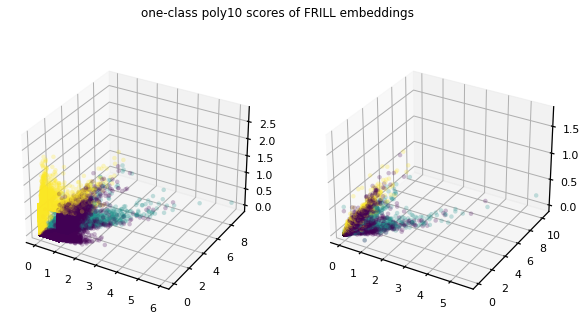

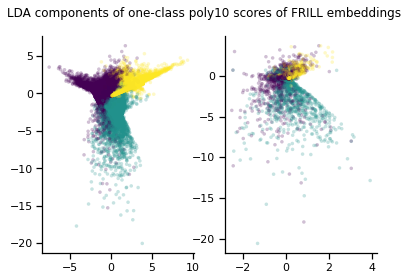

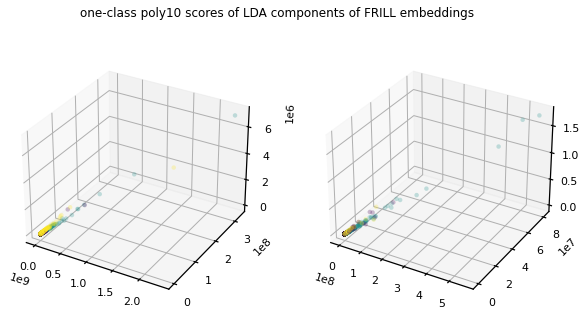

fold 5 completed in 11009.26 s
time: 15h 25min 15s


In [12]:
extract_ocsvm_features(**poly(10))

reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


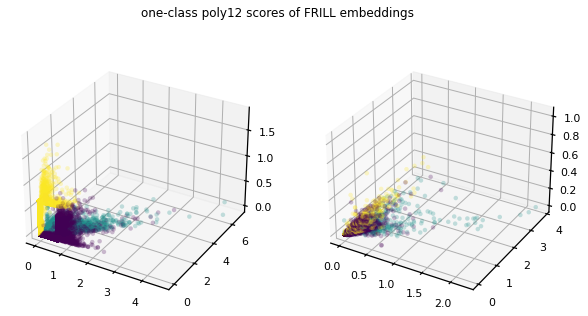

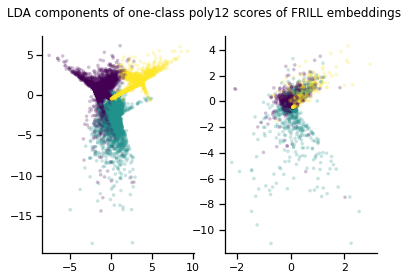

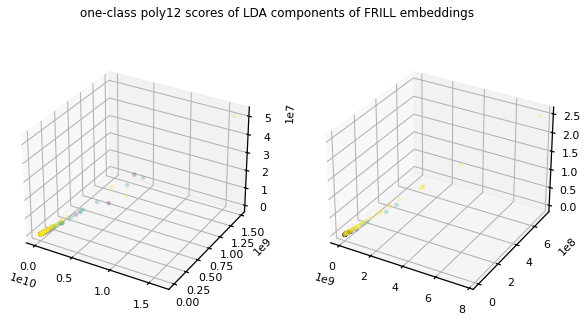

fold 1 completed in 14148.74 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


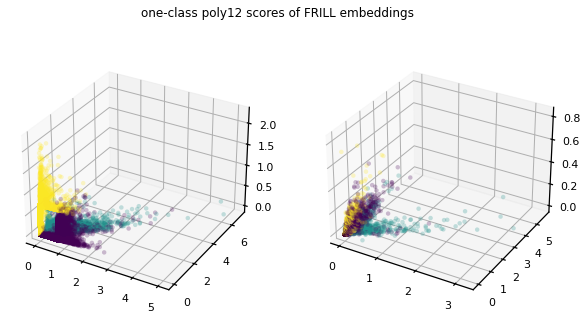

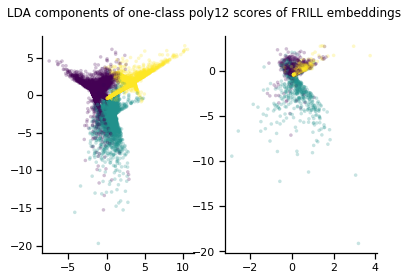

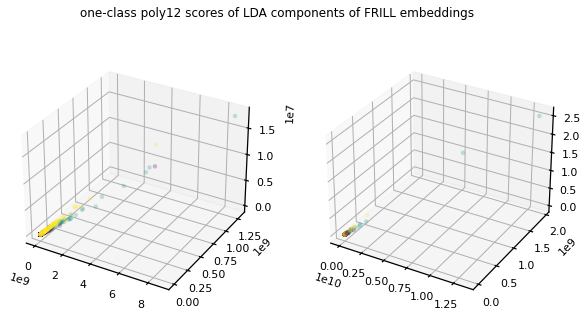

fold 2 completed in 13834.64 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


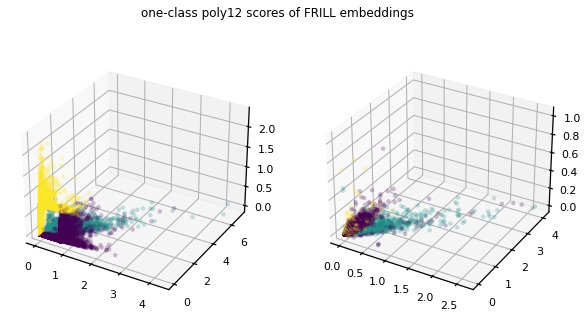

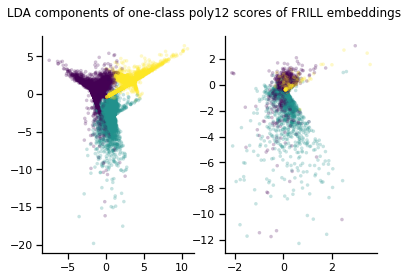

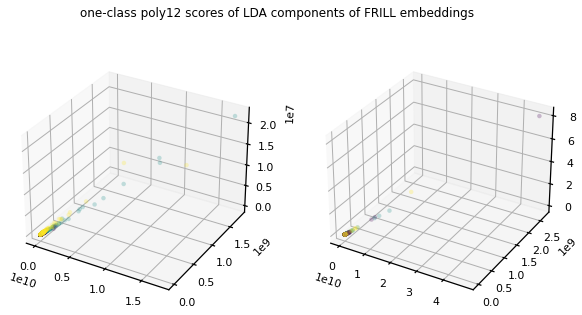

fold 3 completed in 11710.56 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


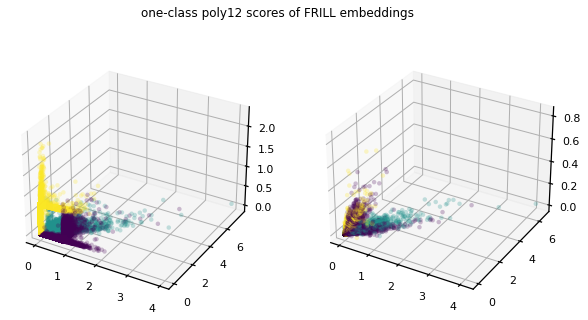

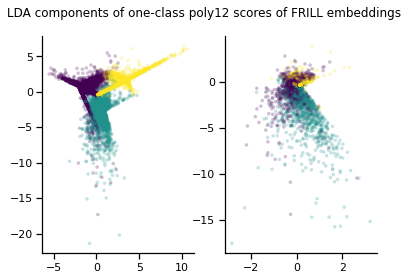

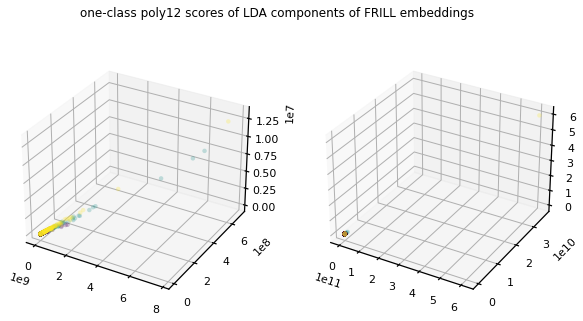

fold 4 completed in 9871.82 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


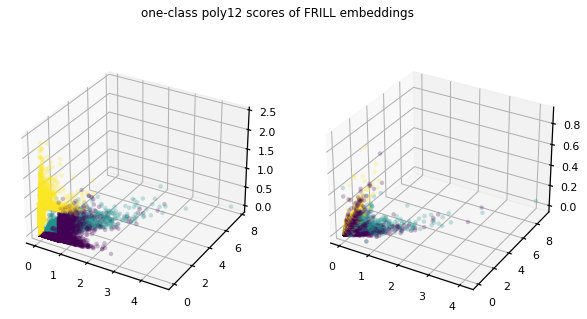

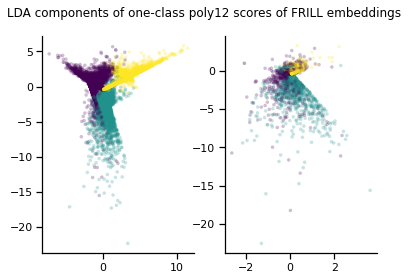

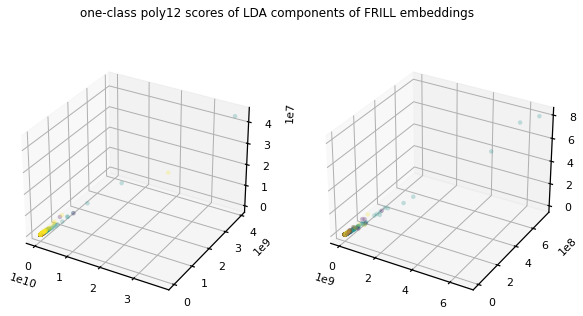

fold 5 completed in 12587.24 s
time: 17h 15min 53s


In [13]:
extract_ocsvm_features(**poly(12))

reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


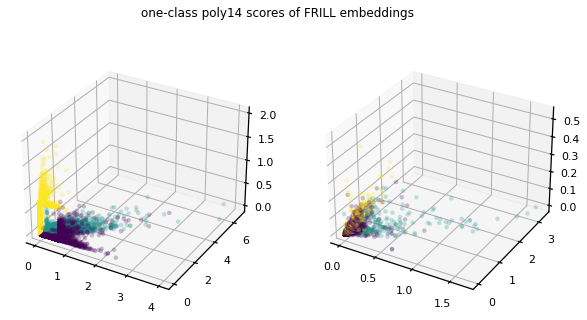

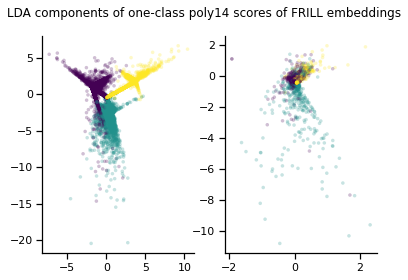

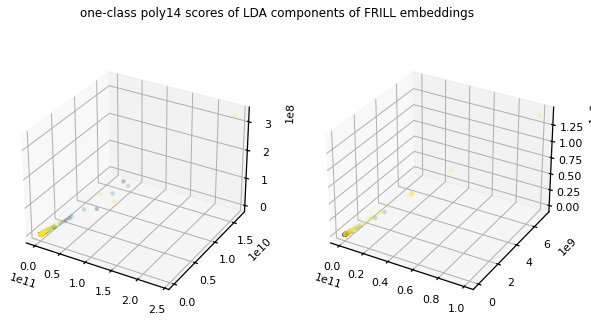

fold 1 completed in 13316.65 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


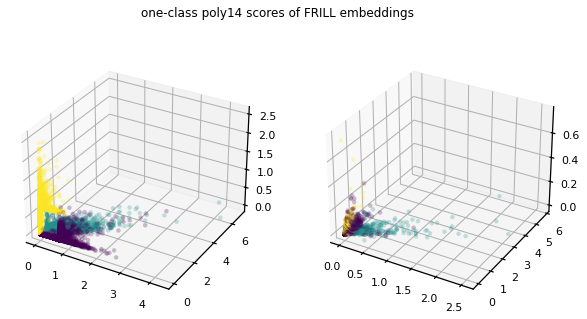

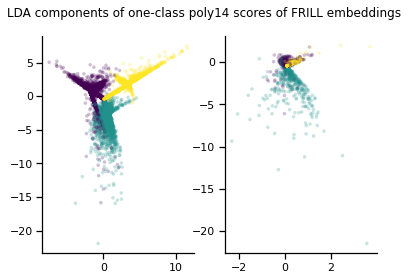

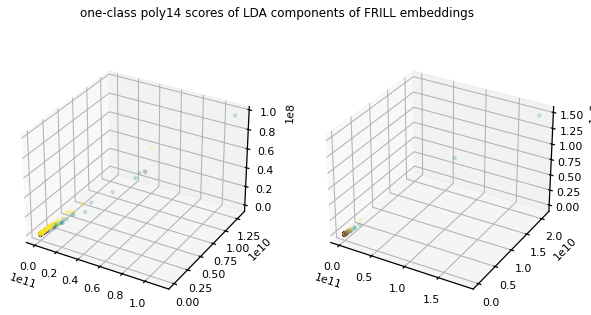

fold 2 completed in 14066.42 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


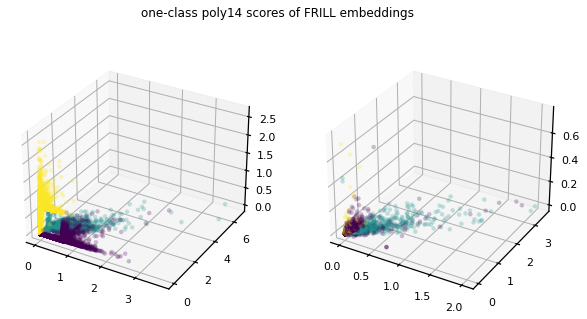

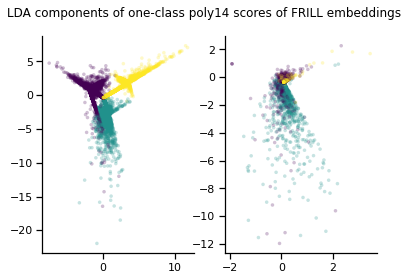

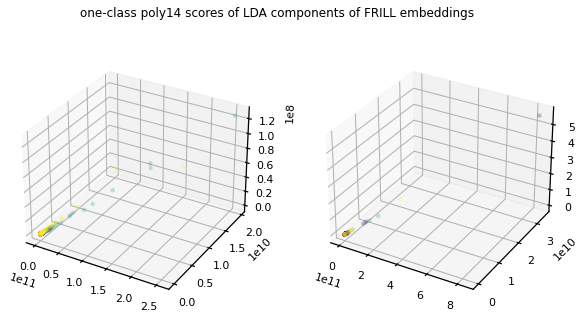

fold 3 completed in 12346.70 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


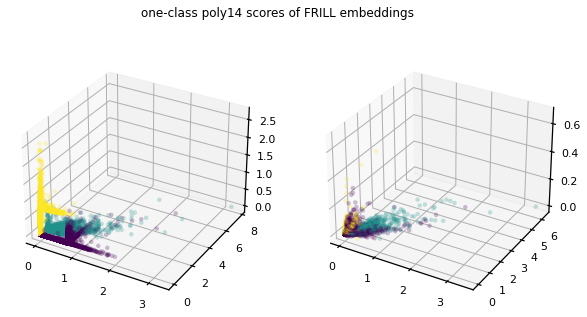

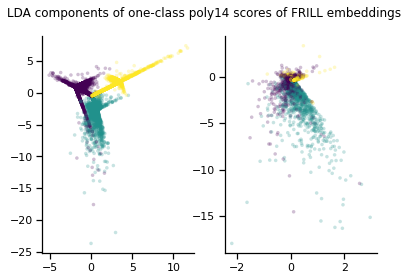

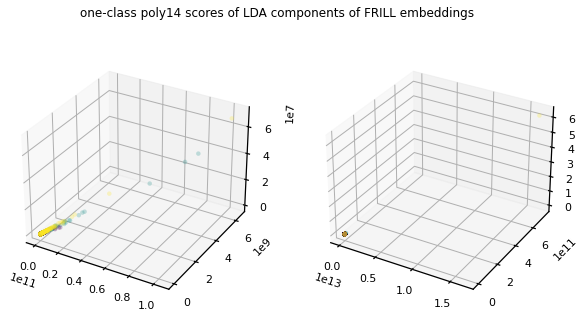

fold 4 completed in 10551.35 s
reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...
saving...


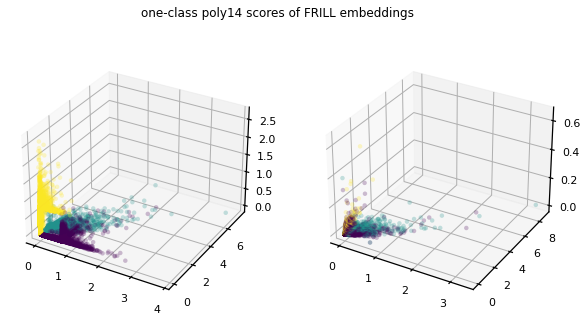

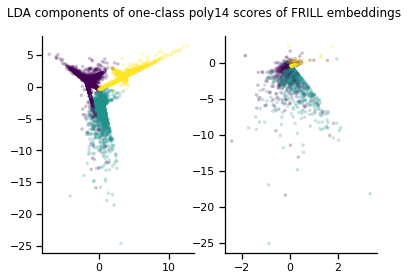

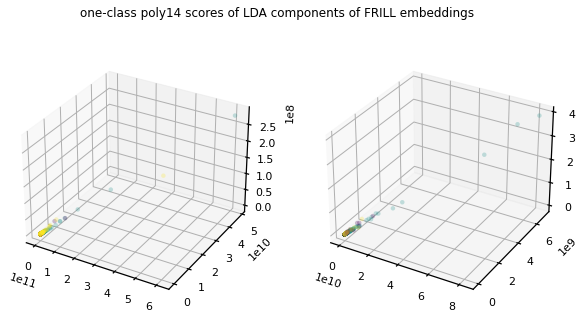

fold 5 completed in 13197.60 s
time: 17h 37min 59s


In [14]:
extract_ocsvm_features(**poly(14))

In [16]:
extract_ocsvm_features(**poly(7))

reading data...
extracting one-class scores of FRILL embeddings...
extracting LDA components of one-class scores of FRILL embeddings...
extracting one-class scores of LDA components of FRILL embeddings...


In [ ]:
extract_ocsvm_features(**poly(9))

In [ ]:
extract_ocsvm_features(**poly(11))

In [ ]:
extract_ocsvm_features(**poly(13))

In [15]:
print(f"Time elapsed since notebook_begin_time: {time() - notebook_begin_time} s")
_ = gc_collect()

Time elapsed since notebook_begin_time: 534875.8766636848 s
time: 150 ms


[^top](#Contents)